# Data Used

## - Image

    - RBG
    - NIR
    - Elevation (crop around location) - need only location (lon, lat)
    - Soil Rasters (crop around location) - need only location (lon, lat)
    - Land Cover (crop around location) - need only location (lon, lat)
    - Human Footprint - summarized - most recent ones (crop around location) - No function need - need only location (lon, lat)

## - Tabular

    - Lon, Lat
    - dayoftheYear
    - year
    - geoUncertaintyinM

# Loading the libraries

In [ ]:
from data.GLC23PatchesProviders import MultipleRasterPatchProvider, RasterPatchProvider, JpegPatchProvider
from data.GLC23Datasets import PatchesDataset,PatchesDatasetMultiLabel, PatchesDatasetBlind
from data.GLC23TimeSeriesProviders import MultipleCSVTimeSeriesProvider, CSVTimeSeriesProvider
from data.GLC23Datasets import TimeSeriesDataset, TimeSeriesBlind
from data.GLC23TimeSeriesProviders import MetaTimeSeriesProvider

# Calculer la richesse spécifique des espèces par zone géographique
import cartopy.crs as ccrs
import torch
from torch.utils.data.dataset import Dataset
from torch.utils.data.dataloader import DataLoader
from sklearn.metrics import precision_score, recall_score, f1_score
from torch import nn
from torchvision import transforms
from torchvision import models
from torch.utils.tensorboard import SummaryWriter
from Models import Resnet18, Resnet50, CNN_TimeSeries
from inception_env import InceptionEnv
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import os
import warnings

warnings.filterwarnings("ignore")

# Section 0 Loading and Declaring the data folders the data

In [5]:
#data_path = 'data/sample_data/' # root path of the data
data_path = '/Users/yoprod/Desktop/MesRecherches/GeoClef/'

train_path = data_path+'Presence_only_occurrences/Presences_only_train.csv'
validation_path = data_path+'Presence_Absence_surveys/Presences_Absences_train.csv'

In [6]:
import pandas as pd

# Charger les fichiers CSV
df1 = pd.read_csv(data_path + 'GLC/test_blind.csv',sep =';')
df2 = pd.read_csv(data_path + 'gt.csv', sep=',')

# Fusionner les DataFrames en utilisant l'index comme clé de fusion
merged_df = pd.concat([df1, df2], axis=1)

merged_df = merged_df.drop_duplicates(subset=['lon', 'lat'])
# Enregistrer le résultat dans un nouveau fichier CSV
merged_df.to_csv('test_final2.csv', index=False, sep=',')

print("Fusion et enregistrement terminés.")


Fusion et enregistrement terminés.


# Section 1 EDA (Exploratory Data Analysis)  & SAMPLING

       1  10  1000  10002  10010  10013  10019  1002  10021  10023  ...  996  \
0      0   0     0      0      0      0      0     0      0      0  ...    0   
1      0   0     0      0      0      0      0     0      0      0  ...    0   
2      0   0     0      0      0      0      0     0      0      0  ...    0   
3      0   0     0      0      0      0      0     0      0      0  ...    0   
4      0   0     0      0      0      0      0     0      0      0  ...    0   
...   ..  ..   ...    ...    ...    ...    ...   ...    ...    ...  ...  ...   
19997  0   0     0      0      0      0      0     0      0      0  ...    0   
19998  0   0     1      0      0      0      0     0      0      0  ...    0   
19999  0   0     0      0      0      0      0     0      0      0  ...    0   
20000  0   0     0      0      0      0      0     0      0      0  ...    0   
20001  0   0     0      0      0      0      0     0      0      0  ...    0   

       9965  9970  9976  9983  9988  99

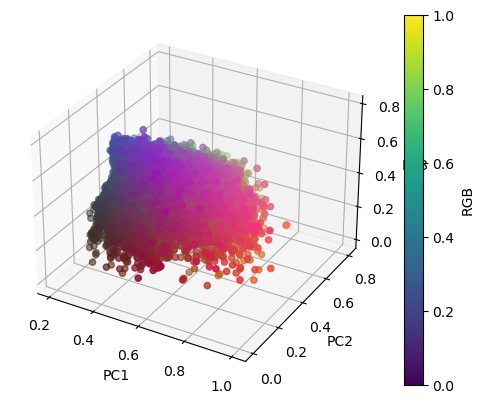

In [7]:


# Charger les données à partir du fichier CSV
data = pd.read_csv(data_path + 'test_final.csv', sep=",", header='infer', low_memory=True)

# Sélectionner les colonnes pertinentes
df = data[['lon', 'lat', 'Expected']]

# Grouper les lignes par longitude et latitude, en réunissant les valeurs 'Expected'
grouped_df = df_unique = data.drop_duplicates(subset=['lon', 'lat'])


# Réinitialiser l'index
grouped_df = grouped_df.reset_index()

species_df = grouped_df['Expected'].str.get_dummies(sep=' ')

# Conversion des colonnes en entiers (0 et 1)
species_df = species_df.astype(int)

print(species_df)
# Imprimer les espèces avec la valeur 1 dans la première ligne
species_row = species_df.iloc[0]
species_1 = species_row[species_row == 1].index.tolist()

#print(species_1)
# Préparer les données pour l'analyse
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix=' ', prefix_sep=' ').groupby(['lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix.head)
# Effectuer l'analyse PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(species_df.values)

# Normaliser les valeurs des composantes dans la plage [0, 1]
pca_result_normalized = (pca_result - np.min(pca_result)) / (np.max(pca_result) - np.min(pca_result))

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized[:, 0]
pc2 = pca_result_normalized[:, 1]
pc3 = pca_result_normalized[:, 2]


# Plot des composantes en tant que RGB
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pc1, pc2, pc3, c=np.column_stack((pc1, pc2, pc3)), cmap='plasma')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
fig.colorbar(scatter, ax=ax, label='RGB')

# Afficher la figure
plt.show()

# Enregistrer la figure avec l'axe 'ax'
fig.savefig('ResBioAl.jpeg')

## Section 2 ALpha diversity MAP

In [ ]:


df_unique['Expected'] = df['Expected'].apply(lambda x: x.split(' '))  # Convertir la chaîne en liste d'espèces

# Calcul de la richesse spécifique
df_unique['richesse'] = df_unique['Expected'].apply(len)
print(df_unique['richesse'] )

# Filtrer les données pour n'inclure que les zones avec richesse spécifique > 0
#data_filtered = df_unique.merge(richesse, on=['lat', 'lon'])
data_filtered = df_unique[df_unique['richesse'] > 0]

# Déterminer les limites de la zone géographique à afficher
min_lon, max_lon = data_filtered['lon'].min(), data_filtered['lon'].max()
min_lat, max_lat = data_filtered['lat'].min(), data_filtered['lat'].max()

# Créer une figure et une projection cartographique
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Définir les limites de la zone géographique à afficher
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Tracer les données de richesse spécifique sur la carte
sc = ax.scatter(data_filtered['lon'], data_filtered['lat'], c=data_filtered['richesse'], cmap='plasma', transform=ccrs.PlateCarree(), s=10, alpha=0.3)

# Ajouter une légende pour la richesse spécifique
cbar = plt.colorbar(sc, label='Richesse spécifique')

# Ajouter des détails de la carte
ax.coastlines()

# Afficher le graphique
plt.show()
fig.savefig("Biodiv_MAP_ALPHA2.png")


## Section 3  Indice de Shanon

In [5]:
# Calculer le nombre total d'individus
total_individus = len(data)

# Calculer le nombre d'individus par espèce
individus_par_espece = data['Expected'].value_counts()
print('individu par especes : {}'.format(individus_par_espece))
# Calculer la proportion d'individus par espèce
proportion_individus = individus_par_espece / total_individus
print('La proportion par individu : {}'.format(proportion_individus))

# Calculer l'indice de Shannon
indice_shannon = -np.sum(proportion_individus * np.log(proportion_individus))

# Afficher l'indice de Shannon
print("L'indice de Shannon est :", indice_shannon)

individu par especes : 8130                                                                                                                                             349
419                                                                                                                                              229
9575                                                                                                                                             184
9794                                                                                                                                              71
1624                                                                                                                                              69
                                                                                                                                                ... 
3069 3925 4723 8079 8912 8987 9309 9627 9823                                       

## Section 4  .1Biodiv Beta 1 PCA directement sur les vecteurs spéces

Nous voudrions dans ce section afficher les PCA extraits à partirs du fichier csv as RGB: PC1 as red, PC2 as Green et PC3 as Blue.


[[0.07584307 0.49973285 0.52493892]
 [0.07946023 0.53419116 0.52201667]
 [0.07322899 0.50084995 0.52574683]
 ...
 [0.10464974 0.42899466 0.67860209]
 [0.315732   0.44138149 0.79164394]
 [0.27033645 0.42930451 0.74235797]]
(20002, 3)
(20002, 3)


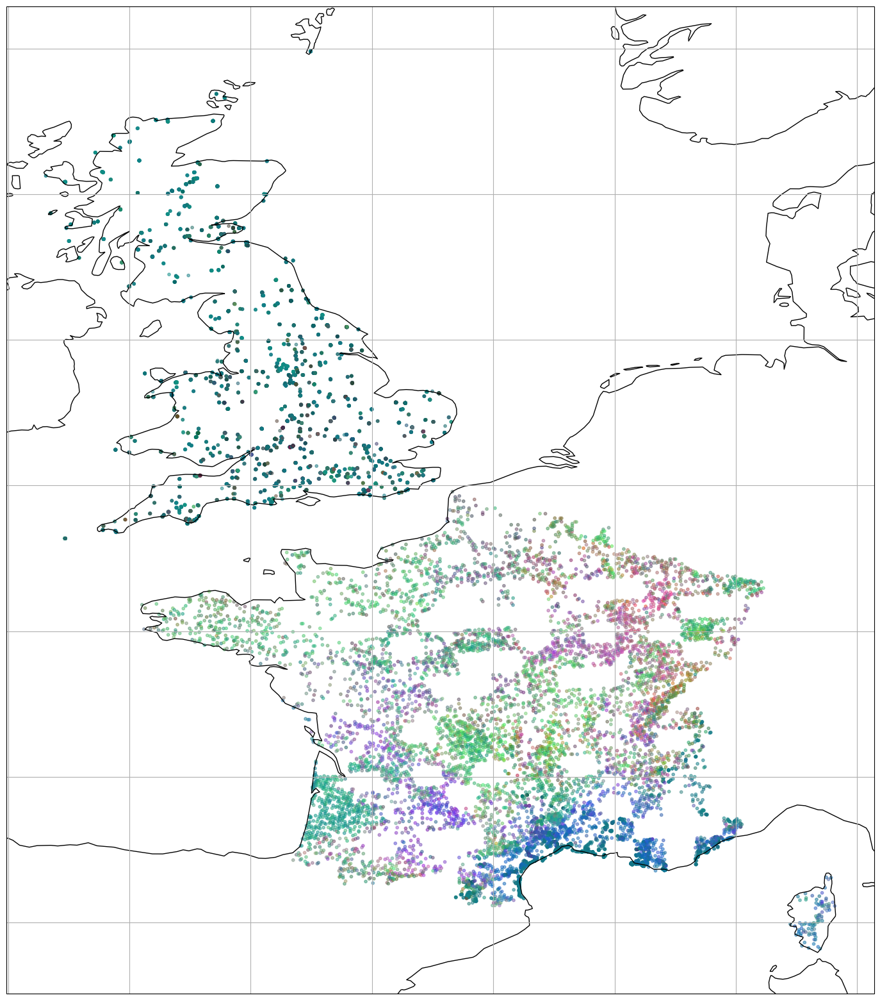

In [6]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

# Load the data from the CSV file
data = pd.read_csv(data_path + 'test_final.csv', sep=",", header='infer', low_memory=True)

#df = grouped_data[['lon', 'lat', 'speciesId']]
#df = grouped_data = data.groupby(['lat', 'lon'])['Expected'].apply(lambda x: ' '.join(map(str, x))).reset_index()

#df_unique = data[['lon', 'lat', 'Expected']]

#presence_absence_matrix = pd.get_dummies(df_unique, columns=['speciesId'], prefix='', prefix_sep='').groupby(['lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix.shape)

#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(species_df.values)
#print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized0 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

print(pca_result_normalized0)
print(pca_result_normalized0.shape)
# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized0[:, 0]
pc2 = pca_result_normalized0[:, 1]
pc3 = pca_result_normalized0[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]
# Create a colormap using PC1 as red, PC2 as green, and PC3 as blue
cmap = mcolors.LinearSegmentedColormap.from_list('custom_cmap', list(zip(pc1, pc2, pc3)), N=512)

print(rgb_values.shape)
# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=rgb_values, cmap=cmap, transform=ccrs.PlateCarree(), s=10 , alpha=0.5)
#cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=False)

# Show the map
plt.show()
fig.savefig('ResBioA2.jpg')

## Section 4  .2Biodiv Beta 1 PCA sur la dissimilarité de JACCARD entre les points uniques


## Indice de Jaccard entre les différents sites puis stocker dans un fichier CSV
-1 Indice de Jaccard
-2 Indice de Jaccard
Tous les deux donneent le même résultat aprés plot.


In [7]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors
from sklearn.metrics.pairwise import pairwise_distances
data_path = '/Users/yoprod/Desktop/MesRecherches/GeoClef/'

# Load the data from the CSV file
#data['speciesId'] = data['speciesId'].astype(float)

#data = pd.read_csv(data_path + 'PAbsences.csv', sep=",", header='infer', low_memory=True)
#grouped_data = data.groupby(['lat', 'lon'])['Expected'].apply(lambda x: ','.join(map(str, x))).reset_index()
#print(grouped_data.head)
#df = grouped_data

#df_unique = data
df2 = pd.DataFrame(columns=['Jaccard'])

#presence_absence_matrix = pd.get_dummies(df_unique, columns=['Expected'], prefix='', prefix_sep='').groupby(['lon', 'lat']).max().reset_index(drop=True)

Matrice = []
sample_id = []

#vectors = [row.split(',') for row in grouped_data['speciesId']]
#vectors = [[float(value) for value in row] for row in vectors]
#print(type(vectors[0][0]))
#print(type(vectors[0]))
#print(type(vectors))


#for i in range(len(vectors)):
#    Matrice.append(vectors[i])
#print(np.array(vectors))
similarity_matrix = 1 - pairwise_distances(np.array(species_df.values), metric='jaccard')
#define Jaccard Similarity function
# Créer un DataFrame à partir de la matrice de similarité
for i in range(len(similarity_matrix)):    
    df2 = df2.append({'Jaccard': similarity_matrix[i]}, ignore_index=True)
df2.to_csv('jac2x.csv',sep=' ', index = False)

[[1.         0.42857143 0.17241379 ... 0.         0.         0.        ]
 [0.42857143 1.         0.15384615 ... 0.         0.         0.        ]
 [0.17241379 0.15384615 1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.38888889 0.28947368]
 [0.         0.         0.         ... 0.38888889 1.         0.34090909]
 [0.         0.         0.         ... 0.28947368 0.34090909 1.        ]]
[[-5.32154593 -0.93032143 -0.91473353]
 [-4.85353361 -1.63860429 -0.46391056]
 [-5.33246199 -0.97363388 -0.87484551]
 ...
 [-4.22923877 -0.28328385 -1.98562423]
 [ 0.5954285  -0.25341302 -2.39999258]
 [-0.55846006 -0.32999526 -2.29741185]]


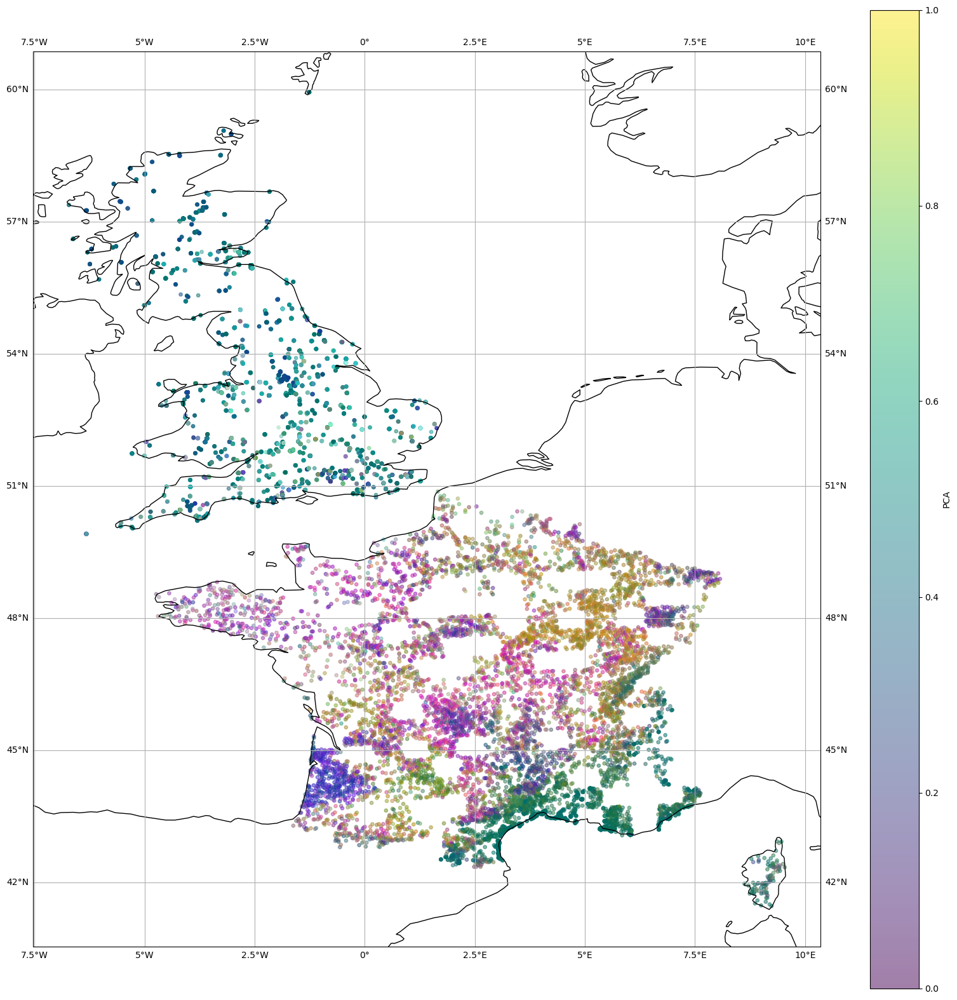

In [8]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors
import ast

# Load the data from the CSV file
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
data2 = pd.read_csv('jac2x.csv', sep=" ", header='infer', low_memory=True)
#print(data2.head)


# Assign the matrix back to the DataFrame or use it for further analysis
#data['your_column'] = matrix
#data2 = data2.infer_objects()

presence_absence_matrix = similarity_matrix
print(presence_absence_matrix)
#print(matrix.shape)
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized1 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized1[:, 0]
pc2 = pca_result_normalized1[:, 1]
pc3 = pca_result_normalized1[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=rgb_values, transform=ccrs.PlateCarree(),s=15,  alpha=0.5)
cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
fig.savefig('BetaBioA2.jpg')

## Section 5 Avec le PCoA 

Ici nous appliquons le PCoA sur la matrice de distance obtenu précédemment.
Avec la bibliothèque scikit mainfold MDS de scikit learn.


In [ ]:
!pip install scikit-bio


In [ ]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors
from sklearn.manifold import MDS
# Load the data from the CSV file
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
#data2 = pd.read_csv('jac2.csv', sep=",", header='infer', low_memory=True)
#print(data2.head)

#df = grouped_data[['patchID', 'lon', 'lat', 'speciesId']]

#df_unique = data[['patchID', 'lon', 'lat', 'speciesId']]

# Apply PCA
pca = MDS(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized1_1 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized1_1[:, 0]
pc2 = pca_result_normalized1_1[:, 1]
pc3 = pca_result_normalized1_1[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df['lon'], df['lat'], c=rgb_values, transform=ccrs.PlateCarree(), s=15, alpha=0.5)
cbar = plt.colorbar(scatter, label='PCoA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
fig.savefig('BetaBioPCOA.jpg')


## Section 6. Get vector from pretrained models (CNNTimeseries, Resnet(for images) )

## Section 6.1 TIMESERIES
## Import Model 1 Timeseries and save prediction from this models to a file.csv 
##
We have Three Files of CSV from prediction vectors of models: Pred_resnet.csv, Pred_timeseries.csv and Pred_incep.csv

And an other Threes Files of csv from the before last vectors from this model in three files : Predvec_resnet.csv, Predvec_timeseries.csv and Predvec


In [57]:
class TimeSeriesBlind2(Dataset):
    def __init__(
        self,
        occurrences,
        providers,
        transform=None,
        target_transform=None,
        id_name="timeSerieID",
        #label_name="Labels",
        item_columns=['timeSerieID'],
    ):
        self.occurences = Path(occurrences)
        self.base_providers = providers
        self.transform = transform
        self.target_transform = target_transform
        self.provider = MetaTimeSeriesProvider(self.base_providers, self.transform)

        df = pd.read_csv(self.occurences, sep=",", header='infer', low_memory=False)

        self.observation_ids = df[id_name].values
        self.items = df[item_columns]
        #self.targets = df[label_name].values
    
    def __len__(self):
        return len(self.observation_ids)

    def __getitem__(self, index):
        item = self.items.iloc[index].to_dict()

        patch = self.provider[item]

        #target = self.targets[index]

        #if self.target_transform:
        #    target = self.target_transform(target)

        return torch.from_numpy(patch).float()

In [58]:
#ts_red = CSVTimeSeriesProvider(data_path+'SatelliteTimeSeries/time_series_red.csv')
#ts_multi = MultipleCSVTimeSeriesProvider(data_path+'SatelliteTimeSeries/', select=['red','green','blue'])
ts_all = MultipleCSVTimeSeriesProvider(data_path+'SatelliteTimeSeries/')
print('OK')
# create dataset
#testdataset = TimeSeriesMultilabel(occurrences=data_path+'GLC/PA_Labels.csv',
#                            providers=[ts_all])


OK


In [59]:
from pathlib import Path

testdataset = TimeSeriesBlind2(occurrences=data_path + 'GLC/test_final.csv',
                            providers=[ts_all])

In [69]:

        
        
N_Classes = 2174
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = CNN_TimeSeries(N_Classes)
#in_features = model.fc2[1].out_features  # Récupérer le nombre de caractéristiques en entrée de la dernière couche
#model.fc = nn.Linear(out_features, N_Classes)  # Remplacer la dernière couche par une nouvelle couche de sortie

# load the model checkpoint
checkpoint = torch.load(data_path + 'GLC/final_model.pth',map_location=torch.device('cpu'))
# load model weights state_dict
# create new OrderedDict that does not contain `module.`
#from collections import OrderedDict

#new_state_dict = OrderedDict()
#for k, v in checkpoint.items():
#    name = k.replace("module.", "") # remove `module.`
#    new_state_dict[name] = v

# load params
#model.load_state_dict(new_state_dict, strict=False)
#model = torch.nn.Sequential(*list(model.children())[:-1])

#model.eval()

best_model_cp = torch.load('outputs/best_model.pth')
#best_model_epoch = best_model_cp['epoch']
#print(f"Best model was saved at {best_model_epoch} epochs\n")
# load the last model checkpoint
#last_model_cp = torch.load('outputs/final_model.pth')
#last_model_epoch = last_model_cp['epoch']
#print(f"Last model was saved at {last_model_epoch} epochs\n")

#test_last_model(model, last_model_cp, test_loader)

#test_best_model(model, best_model_cp, test_loader)

CNN_TimeSeries(
  (conv1d_1): Sequential(
    (0): Conv1d(6, 32, kernel_size=(2,), stride=(1,))
    (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv1d_2): Sequential(
    (0): Conv1d(32, 64, kernel_size=(2,), stride=(1,))
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv1d_3): Sequential(
    (0): Conv1d(64, 128, kernel_size=(2,), stride=(1,))
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (relu): ReLU()
  (maxpool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu1): ReLU(inplace=True)
  (fc1): Sequential(
    (0): Dropout(p=0.2, inplace=False)
    (1): Linear(in_features=2432, out_features=128, bias=True)
  )
  (fc2): Sequential(
    (0): Dropout(p=0.2, inplace=False)
    (1): Linear(in_features=128, out_features=2174, bias=True)
  )
  (sigm): Sigmoid()
)

In [72]:
# Run inference on the test data
import pandas as pd
LabelName ="speciesId"
# Charger les données à partir du fichier CSV
ocPa = pd.read_csv(validation_path, header='infer', sep=';')
df = pd.DataFrame(columns=['Id','Predicted'])

targets = ocPa[LabelName].values
targets_sorted = np.unique(np.sort(targets))

model.eval()
for sample_id in range(len(testdataset)):
    test_img = testdataset[sample_id]
    with torch.no_grad():
        raw_pred = model(test_img).cpu().numpy()[0]
        raw_pred = np.array(raw_pred > 0.8, dtype=float)
    predicted_labels = np.array(targets_sorted)[np.argwhere(raw_pred > 0)[:, 0]] # carefull here
    print(predicted_labels)
    #if not len(predicted_labels): 
    #    predicted_labels = ['no predictions']
    #img_labels = np.array(train_dataset.classes)[np.argwhere(test_labels > 0)[:, 0]]
    #print("Predicted labels: {} \nGT labels: {}".format(predicted_labels, img_labels), end="\n ------------ \n")
    #especes_correspondantes = []
    #for label in predicted_labels:
    #    ligne = ocPa[ocPa['Labels'] == label]
    #    espece = ligne['speciesId'].values[0] if not ligne.empty else None
    #    especes_correspondantes.append(espece)
    #    lig = ' '.join(map(str, especes_correspondantes))
    df = df.append({'Id': sample_id+1,  'Predicted': predicted_labels}, ignore_index=True)
df.to_csv('timeseriesX201.csv',sep=",", index=False)

[   5   11  121  130  133  145  159  217  222  224  236  248  255  314
  364  401  427  441  445  459  595  615  676  684  751  753  803  890
  917  957 1005 1052 1072 1099 1110 1158 1170 1176 1213 1232 1317 1329
 1384 1439 1449 1514 1548 1551 1596 1624 1740 1751 1779 1795 1827 1873
 1877 1889 1890 1893 1915 1916 1982 1998 2092 2105 2132 2134 2136 2161
 2167 2177 2200 2247 2336 2339 2422 2433 2501 2511 2591 2647 2671 2677
 2838 2843 2871 2872 3077 3127 3136 3141 3187 3190 3194 3297 3317 3334
 3348 3381 3384 3406 3408 3426 3440 3480 3501 3551 3553 3556 3579 3593
 3649 3660 3661 3781 3790 3942 4023 4032 4086 4190 4211 4220 4264 4290
 4291 4315 4327 4351 4355 4397 4423 4506 4520 4553 4587 4596 4599 4630
 4649 4661 4675 4715 4779 4838 4861 4885 4904 4961 4989 5067 5072 5200
 5233 5235 5247 5268 5295 5313 5337 5360 5404 5432 5484 5520 5560 5597
 5603 5670 5721 5751 5783 5793 5800 5806 5847 5854 5896 5913 5944 5966
 5989 5992 6050 6080 6138 6146 6156 6162 6178 6226 6235 6253 6261 6271
 6278 

[    5    11    24    33   118   121   124   130   133   142   145   159
   184   187   217   224   235   236   248   254   255   270   314   321
   342   364   397   401   427   437   441   442   445   459   492   494
   501   523   581   595   615   663   676   684   717   751   753   783
   792   793   845   873   876   890   913   917   957   970  1005  1013
  1052  1059  1083  1099  1110  1158  1170  1176  1213  1246  1258  1267
  1273  1289  1317  1329  1345  1350  1358  1364  1380  1384  1429  1439
  1446  1449  1499  1505  1514  1543  1545  1548  1551  1553  1576  1596
  1602  1613  1624  1633  1662  1706  1740  1779  1784  1790  1795  1811
  1815  1827  1830  1849  1853  1857  1861  1866  1868  1873  1877  1889
  1893  1915  1916  1935  1952  1982  1995  1998  2029  2039  2069  2083
  2092  2105  2132  2134  2136  2163  2167  2177  2230  2247  2274  2291
  2308  2319  2336  2339  2355  2382  2422  2433  2461  2501  2511  2514
  2591  2606  2627  2631  2647  2677  2694  2702  2

[   5   11  118  121  130  133  145  217  224  236  248  254  255  314
  321  364  401  427  684  751  873  913  917  957 1005 1052 1110 1232
 1317 1329 1345 1384 1439 1449 1596 1624 1740 1779 1795 1868 1889 1916
 1998 2039 2092 2105 2134 2167 2177 2230 2336 2339 2382 2422 2433 2511
 2591 2677 2810 2838 2948 3077 3127 3190 3297 3384 3406 3426 3480 3501
 3579 3593 3649 3660 3662 3701 3751 3790 3939 4086 4173 4190 4264 4290
 4315 4327 4351 4501 4506 4520 4587 4599 4630 4661 4715 4861 4904 4976
 4989 5072 5235 5268 5295 5307 5313 5404 5432 5520 5555 5603 5670 5721
 5800 5806 5847 5854 5913 5944 6080 6138 6156 6253 6271 6330 6421 6438
 6449 6477 6501 6538 6617 6642 6664 6730 6759 6868 6946 6972 7063 7073
 7079 7081 7216 7222 7243 7328 7364 7413 7430 7471 7474 7590 7734 7747
 7760 7865 7904 7989 8059 8109 8303 8323 8468 8637 8653 8670 8805 8809
 9064 9096 9509 9546 9547 9548 9596 9753 9768 9788 9794 9886 9904 9994]
[    5    11    33   118   121   124   125   130   133   142   145   159
   

[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1384 1439 1449 1740 1889 1916 2092
 2167 2336 2433 2511 2810 3077 3190 3384 3408 3426 3480 3593 3660 3701
 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661 4904
 4989 5072 5295 5404 5432 5520 5603 5670 5800 5806 5847 5854 5913 6162
 6178 6271 6393 6438 6449 6477 6501 6617 6642 6664 6730 6759 6868 6946
 7063 7073 7079 7216 7222 7328 7430 7471 7734 7760 7865 7883 8059 8303
 8323 8468 8637 8670 8805 8809 9064 9096 9319 9546 9547 9596 9768 9788
 9794 9885 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  684  917
  957 1005 1072 1110 1317 1384 1439 1449 1889 1916 2092 2167 2336 2433
 2511 3077 3190 3408 3426 3480 3593 3660 3701 3781 3790 4086 4190 4264
 4290 4315 4327 4506 4520 4630 4661 4904 5072 5295 5404 5432 5520 5603
 5670 5800 5806 5847 5854 5913 6178 6271 6393 6449 6477 6501 6617 6642
 6664 6730 6868 6946 7063 7073 7079 7216 7328 7430 7471 7734

[ 236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511 3077
 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5295 5603 5670
 5854 6501 6617 6642 6664 7216 7328 7471 7734 7865 8059 8468 8637 8670
 8805 9096 9768 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917 1005 1072 1110 1317 1384 1439 1449 1740 1779 1889 1915 1916
 2092 2167 2319 2336 2339 2422 2433 2511 2647 2711 2810 3077 3190 3297
 3384 3408 3426 3480 3593 3649 3660 3701 3781 3790 3942 4086 4190 4264
 4290 4315 4327 4506 4520 4630 4661 4904 4989 5072 5268 5295 5313 5404
 5432 5520 5603 5670 5751 5800 5806 5847 5854 5913 6138 6156 6162 6178
 6271 6278 6393 6438 6449 6477 6501 6617 6642 6664 6730 6759 6868 6946
 7063 7066 7073 7079 7216 7222 7328 7430 7471 7730 7734 7760 7865 7883
 7904 8059 8172 8303 8323 8381 8416 8468 8637 8653 8670 8805 8809 9064
 9096 9479 9546 9547 9596 9768 9788 9794 9885 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  7

[   5   11  217  236  255  314  364  441  684  917 1005 1072 1110 1317
 1384 1439 1449 2092 2167 2433 2511 3077 3190 3426 3480 3593 3660 3790
 4086 4190 4264 4290 4315 4327 4630 4661 4904 5072 5295 5404 5432 5603
 5670 5800 5847 5854 5913 6271 6449 6501 6617 6642 6664 6868 6946 7063
 7073 7079 7216 7328 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670
 8805 8809 9064 9096 9546 9596 9768 9794 9904]
[ 236  255  314  364 1384 2092 3660 4086 4661 5603 6501 6642 8059 9904]
[   5   11  133  217  224  236  255  314  364  401  441  684  917 1005
 1072 1110 1317 1384 1439 1449 1889 1916 2092 2167 2339 2511 3077 3190
 3408 3426 3480 3593 3660 3701 3790 3942 4086 4190 4264 4290 4315 4327
 4506 4520 4630 4661 4904 4989 5072 5268 5295 5404 5432 5520 5603 5670
 5800 5806 5847 5854 5913 6156 6178 6271 6393 6449 6477 6501 6617 6642
 6664 6730 6868 6946 7063 7073 7079 7216 7328 7430 7471 7734 7760 7865
 8059 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547 9596 9768 9794
 9904]
[ 236  364 2092 3660 4

[   5   11  130  133  217  224  236  248  255  314  321  364  401  441
  684  917 1005 1110 1317 1384 1439 1449 1740 1779 1795 1889 1916 2092
 2167 2336 2339 2422 2433 2511 3077 3190 3384 3408 3426 3480 3593 3649
 3660 3662 3781 3790 3942 4086 4190 4264 4290 4315 4506 4520 4599 4630
 4661 4904 5072 5268 5295 5404 5432 5520 5603 5670 5751 5800 5806 5847
 5854 5913 6138 6156 6178 6248 6271 6278 6449 6477 6501 6557 6617 6642
 6664 6730 6868 7063 7073 7079 7216 7243 7328 7364 7430 7471 7734 7747
 7760 7865 7883 8059 8235 8323 8468 8637 8670 8805 8809 8840 9096 9479
 9546 9547 9596 9753 9768 9788 9885 9904]
[ 236  255  364 1384 2092 2511 3660 4086 4315 4661 6501 6642 8059 8468
 8670]
[   5   11  217  224  236  255  314  321  364  401  441  684  917 1005
 1110 1317 1384 1439 1449 1889 1916 2092 2167 2511 3077 3190 3384 3408
 3426 3593 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072 5295 5432
 5603 5670 5800 5854 5913 6178 6271 6449 6477 6501 6617 6642 6664 6868
 7063 7073 7216 7328 7430 74

[  11  133  217  224  236  255  314  364  401  441  684  917 1072 1110
 1317 1384 1439 1449 1779 1889 1916 2092 2161 2167 2336 2511 3077 3190
 3384 3408 3426 3480 3593 3660 3790 4086 4190 4264 4290 4315 4327 4506
 4520 4630 4661 4904 5072 5295 5404 5432 5520 5603 5670 5800 5854 5913
 6178 6271 6449 6477 6501 6617 6642 6664 6868 7063 7073 7079 7216 7328
 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096
 9546 9547 9596 9768 9788 9904 9994]
[   5   11  130  133  145  217  224  236  248  255  314  321  364  401
  441  684  751  873  917 1005 1110 1317 1384 1439 1449 1740 1779 1795
 1889 1916 2092 2134 2167 2336 2339 2422 2433 2511 3054 3077 3190 3384
 3408 3426 3480 3593 3649 3660 3662 3701 3781 3790 3942 4086 4173 4190
 4264 4290 4315 4327 4506 4520 4599 4630 4661 4904 5072 5268 5295 5313
 5404 5432 5520 5603 5670 5751 5800 5806 5847 5854 5913 6138 6156 6178
 6248 6271 6278 6449 6477 6501 6617 6642 6664 6730 6759 6868 7063 7066
 7073 7079 7216 7243 7328 7364 7430 7471

[   5   11  133  217  236  255  314  364  401  441  684  917 1005 1072
 1110 1317 1384 1439 1449 1740 1889 2092 2167 2433 2511 3077 3190 3408
 3426 3480 3593 3660 3790 3942 4086 4190 4264 4290 4315 4327 4520 4630
 4661 4904 5072 5295 5404 5432 5603 5670 5800 5806 5847 5854 5913 6162
 6271 6449 6477 6501 6617 6642 6664 6868 6946 7063 7073 7079 7216 7328
 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9096 9546
 9596 9768 9794 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917 1005 1072 1110 1317 1384 1439 1449 1740 1889 1915 1916 2092
 2134 2136 2167 2336 2339 2422 2433 2511 3077 3190 3384 3406 3408 3426
 3480 3593 3649 3660 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506
 4520 4630 4661 4904 4989 5072 5233 5295 5404 5432 5520 5603 5670 5751
 5800 5806 5847 5854 5913 6138 6156 6162 6178 6271 6438 6449 6477 6501
 6557 6617 6642 6664 6730 6759 6859 6868 6946 7005 7063 7073 7079 7216
 7222 7328 7430 7471 7667 7730 7734 7760 7865 7883 7904

[   5   11  121  130  133  145  217  224  236  248  255  314  321  364
  401  441  445  453  496  684  753  917 1005 1052 1072 1110 1170 1176
 1213 1232 1317 1329 1345 1384 1439 1449 1514 1545 1596 1624 1633 1740
 1779 1795 1811 1868 1873 1889 1915 1916 1952 1982 1998 2092 2105 2134
 2136 2161 2163 2167 2319 2336 2339 2422 2433 2511 2647 2671 2711 2810
 2838 2867 2872 2948 3054 3077 3166 3190 3297 3317 3334 3381 3384 3406
 3408 3426 3480 3593 3649 3660 3662 3701 3781 3790 3874 3939 3942 4032
 4086 4173 4190 4264 4290 4291 4315 4327 4425 4506 4520 4599 4630 4661
 4715 4779 4852 4904 4961 4989 5072 5204 5233 5235 5268 5295 5313 5404
 5432 5520 5530 5603 5670 5721 5751 5783 5800 5806 5847 5854 5913 5944
 5966 5992 6050 6138 6156 6162 6178 6231 6248 6271 6278 6344 6393 6436
 6438 6449 6477 6501 6538 6557 6617 6642 6664 6674 6730 6759 6859 6868
 6946 6972 7005 7063 7066 7073 7076 7079 7081 7103 7216 7222 7243 7302
 7307 7327 7328 7364 7413 7430 7446 7471 7477 7519 7667 7730 7734 7747
 7760 

[    5    11    33   118   121   130   133   142   145   159   184   187
   217   224   236   242   248   254   255   270   277   314   321   354
   364   401   427   441   442   445   453   488   493   523   615   676
   684   717   751   792   873   890   904   913   917   933   957  1005
  1013  1052  1072  1099  1110  1170  1176  1232  1246  1273  1317  1329
  1345  1358  1364  1380  1384  1429  1439  1446  1449  1463  1514  1548
  1551  1596  1602  1624  1633  1662  1708  1721  1725  1740  1751  1779
  1795  1811  1827  1849  1853  1861  1868  1873  1889  1893  1915  1916
  1952  1982  1998  2029  2039  2075  2092  2105  2134  2136  2161  2163
  2167  2177  2200  2230  2247  2291  2319  2336  2339  2382  2407  2422
  2433  2461  2462  2487  2501  2511  2631  2647  2677  2694  2711  2734
  2790  2810  2838  2867  2871  2872  2877  2899  2948  3008  3037  3048
  3054  3077  3127  3136  3141  3157  3190  3194  3297  3311  3317  3348
  3350  3381  3384  3408  3422  3426  3480  3501  3

[ 217  236  255  314  364  441  684  917 1110 1317 1384 1439 2092 2167
 2511 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072
 5295 5404 5432 5603 5670 5854 5913 6271 6449 6501 6617 6642 6664 7216
 7328 7430 7471 7734 7760 7865 8059 8468 8637 8670 8805 9096 9768 9904]
[   5  145  217  224  236  255  314  321  364  684  873  913  917 1384
 1439 1779 1916 2092 2167 2336 2433 2511 2838 2948 3077 3190 3317 3426
 3480 3593 3649 3660 3662 3790 4086 4173 4190 4264 4315 4501 4506 4520
 4587 4630 4661 4904 4989 5072 5313 5404 5520 5603 5604 5670 5847 5854
 5913 6156 6253 6278 6449 6477 6501 6642 6664 6759 6868 7073 7079 7216
 7328 7430 7471 7734 7747 7760 7771 7865 8059 8323 8416 8468 8637 8653
 8670 8805 8809 9596 9753 9768 9788 9794 9904]
[ 217  236  255  314  364  441  684  917 1110 1317 1384 1439 2092 2167
 2511 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072
 5295 5404 5432 5603 5670 5854 5913 6271 6449 6501 6617 6642 6664 7216
 7328 7430 7471 7734 7760 786

[   5   11  121  130  133  145  217  224  236  248  255  314  321  364
  401  441  445  684  753  917  957 1005 1013 1052 1072 1110 1176 1213
 1232 1275 1317 1329 1345 1384 1439 1449 1514 1545 1596 1624 1633 1740
 1779 1795 1811 1827 1868 1873 1889 1915 1916 1952 1982 1998 2092 2105
 2134 2136 2161 2163 2167 2319 2336 2339 2422 2433 2511 2647 2711 2810
 2867 2872 2948 3054 3077 3166 3190 3297 3317 3334 3381 3384 3406 3408
 3426 3480 3593 3649 3660 3662 3701 3781 3790 3874 3942 4032 4086 4173
 4190 4264 4290 4291 4315 4327 4425 4506 4520 4599 4630 4661 4715 4779
 4861 4904 4961 4989 5072 5204 5233 5235 5268 5295 5313 5404 5432 5520
 5530 5603 5604 5670 5751 5783 5800 5806 5847 5854 5913 5944 5992 6050
 6138 6146 6156 6162 6178 6231 6248 6271 6278 6344 6393 6436 6438 6449
 6477 6501 6538 6557 6617 6642 6654 6664 6674 6710 6730 6759 6859 6868
 6946 6972 7005 7063 7066 7073 7076 7079 7081 7103 7216 7222 7243 7302
 7327 7328 7364 7413 7430 7471 7477 7519 7568 7667 7730 7734 7747 7760
 7865 

[   5  118  217  224  236  255  314  364  441  445  684  751  917 1110
 1317 1384 1439 1449 1779 1998 2092 2167 2336 2511 2838 3077 3190 3384
 3408 3426 3593 3649 3660 3662 3701 3781 3790 4086 4190 4264 4290 4315
 4327 4630 4661 4904 5072 5404 5432 5520 5603 5670 5847 5854 5913 6178
 6449 6477 6501 6642 6664 6730 6759 7073 7079 7216 7328 7471 7734 7865
 8059 8323 8468 8637 8670 8805 8809 9096 9479 9547 9768 9788 9904]
[   5  217  224  236  255  314  364  684  751  917 1110 1317 1384 1439
 1449 2092 2167 2336 2511 2838 3077 3190 3426 3593 3649 3660 3662 3701
 3781 3790 4086 4190 4264 4315 4327 4630 4661 4904 5072 5404 5432 5520
 5603 5670 5847 5854 5913 6449 6477 6501 6642 6664 6730 7073 7079 7216
 7328 7471 7734 7865 8059 8323 8468 8637 8670 8805 8809 9096 9547 9768
 9904]
[   5  236  255  314  364  684  751  917 1110 1317 1384 1439 2092 2167
 2511 3077 3190 3426 3649 3660 4086 4190 4264 4315 4327 4661 4904 5072
 5603 5670 5847 5854 5913 6449 6501 6642 6664 7073 7216 7328 7471 7734
 78

[   5  118  217  224  236  255  314  364  445  684  751  917 1110 1317
 1384 1439 1449 1779 2092 2167 2336 2511 2838 3077 3190 3426 3593 3649
 3660 3662 3701 3781 3790 4086 4190 4264 4315 4327 4661 4904 5072 5404
 5432 5520 5603 5670 5847 5854 5913 6178 6449 6477 6501 6642 6664 6730
 6759 7073 7079 7216 7328 7471 7734 7865 8059 8323 8468 8637 8670 8805
 8809 9096 9768 9904]
[   5  217  224  236  255  314  364  684  751  917 1110 1317 1384 1439
 2092 2167 2336 2511 2838 3077 3190 3426 3593 3649 3660 3781 3790 4086
 4190 4264 4315 4327 4661 4904 5072 5404 5432 5520 5603 5670 5847 5854
 5913 6449 6501 6642 6664 7073 7079 7216 7328 7471 7734 7865 8059 8323
 8468 8637 8670 8805 8809 9768 9904]
[   5  217  224  236  255  314  364  441  445  684  751  917 1110 1317
 1384 1439 1449 1779 2092 2167 2336 2511 2838 3077 3190 3384 3408 3426
 3593 3649 3660 3662 3701 3781 3790 4086 4190 4264 4315 4327 4630 4661
 4904 5072 5404 5432 5520 5603 5670 5751 5847 5854 5913 6178 6449 6477
 6501 6642 6664 67

[   5  217  236  255  314  364  441  684  917 1005 1072 1110 1317 1384
 1439 2092 2167 2511 3077 3190 3426 3593 3660 3790 4086 4190 4264 4290
 4315 4327 4630 4661 4904 5072 5295 5404 5432 5603 5670 5847 5854 5913
 6271 6449 6501 6617 6642 6664 6868 6946 7063 7073 7079 7216 7328 7430
 7471 7734 7865 8059 8323 8468 8637 8670 8805 8809 9096 9596 9768 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  445
  684  751  753  873  917  957 1005 1072 1110 1275 1317 1345 1384 1439
 1449 1545 1633 1740 1779 1795 1811 1868 1873 1889 1915 1916 1998 2092
 2134 2167 2319 2336 2339 2422 2433 2511 2647 2711 2810 3077 3166 3190
 3297 3317 3384 3406 3408 3426 3480 3579 3593 3649 3660 3662 3701 3781
 3790 3942 4086 4190 4264 4290 4315 4327 4395 4506 4520 4630 4661 4861
 4904 4989 5072 5235 5268 5295 5313 5404 5432 5520 5603 5670 5721 5751
 5800 5806 5847 5854 5913 6050 6156 6162 6178 6231 6248 6253 6271 6278
 6344 6393 6438 6449 6477 6501 6538 6557 6617 6642 6654 6664 6730 6759
 6868

[]
[]
[]
[]
[]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1384 1439 1449 1740 1779 1889 1916
 2092 2167 2336 2339 2433 2511 2810 3077 3190 3297 3408 3426 3480 3593
 3660 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630
 4661 4904 4989 5072 5295 5313 5404 5432 5520 5603 5670 5800 5806 5847
 5854 5913 6156 6162 6178 6248 6271 6393 6438 6449 6477 6501 6617 6642
 6664 6730 6868 6946 7063 7066 7073 7079 7216 7222 7328 7430 7471 7734
 7760 7865 7883 8059 8323 8381 8468 8637 8653 8670 8805 8809 9064 9096
 9319 9546 9547 9596 9768 9788 9794 9885 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  684  917
 1005 1072 1110 1317 1384 1439 1449 1740 1889 1916 2092 2167 2336 2433
 2511 3077 3190 3426 3480 3593 3660 3781 3790 3942 4086 4190 4264 4290
 4315 4327 4506 4520 4630 4661 4904 4989 5072 5295 5404 5432 5520 5603
 5670 5800 5806 5847 5854 5913 6162 6178 6271 6449 6477 6501 6617 6642
 6664 6730 6868

[   5   11  130  133  145  217  224  236  255  314  321  364  401  441
  684  753  917 1005 1072 1110 1317 1384 1439 1449 1624 1740 1779 1795
 1889 1915 1916 2092 2134 2136 2161 2167 2319 2336 2339 2433 2511 2647
 2867 2948 3054 3077 3166 3190 3297 3384 3406 3408 3426 3480 3593 3649
 3660 3662 3781 3790 3874 3942 4086 4173 4190 4264 4290 4315 4327 4506
 4520 4630 4661 4904 4989 5072 5204 5268 5295 5313 5404 5432 5520 5603
 5670 5751 5800 5806 5847 5854 5913 6138 6156 6162 6178 6271 6278 6393
 6438 6449 6477 6501 6557 6617 6642 6664 6730 6759 6868 6946 7063 7066
 7073 7079 7216 7222 7243 7328 7413 7430 7471 7477 7667 7730 7734 7760
 7865 7883 7904 8059 8172 8235 8303 8323 8381 8416 8468 8637 8653 8670
 8805 8809 9064 9096 9319 9399 9479 9546 9547 9596 9753 9768 9788 9794
 9885 9904]
[   5   11  118  145  217  224  236  248  255  314  321  364  401  445
  684  751  873  913  917  957 1005 1072 1099 1110 1170 1317 1329 1384
 1439 1449 1624 1740 1779 1889 1916 1952 1998 2092 2134 2167 2230

[ 236  255  314  364 1384 2092 3426 3660 4086 4315 4661 5072 5603 5854
 6501 6642 7073 7216 7471 7734 7865 8059 8468 8670 9904]
[ 236  255  364 1384 2092 3660 4086 4661 5072 6501 6642 8059 8468 8670]
[ 236  255  364 1384 2092 3660 4086 4661 5072 6501 6642 8059 8468 8670]
[   5  118  217  236  255  314  321  364  684  751  913  917 1005 1110
 1317 1384 1439 1740 2092 2167 2336 2433 2511 3077 3190 3426 3593 3649
 3660 3701 3790 4086 4190 4264 4290 4315 4327 4520 4630 4661 4904 5072
 5432 5603 5670 5721 5847 5854 5913 6178 6271 6449 6501 6642 6664 6730
 6868 6946 7073 7079 7216 7328 7430 7471 7734 7865 8059 8323 8468 8637
 8670 8805 8809 9596 9768 9794 9904]
[   5   11  118  145  217  224  236  255  314  321  364  441  445  684
  751  873  913  917  957 1005 1110 1317 1384 1439 1449 1740 2092 2167
 2336 2433 2511 2838 3077 3190 3426 3480 3593 3649 3660 3701 3781 3790
 4086 4173 4190 4264 4290 4315 4327 4395 4520 4599 4630 4661 4904 4989
 5072 5268 5295 5313 5404 5432 5520 5603 5670 5721 5

[ 217  236  255  314  364  684  751 1317 1384 2092 3077 3426 3660 4086
 4630 4661 5072 5603 5670 5854 6501 6642 7073 7216 7328 7471 7734 7865
 8059 8323 8468 8670 9904]
[   5  118  217  236  255  314  321  364  684  751  913  917 1005 1110
 1317 1384 1439 1740 2092 2167 2336 2433 2511 2838 3077 3190 3426 3593
 3649 3660 3701 3790 4086 4190 4264 4290 4315 4327 4630 4661 4904 5072
 5432 5603 5670 5847 5854 5913 6271 6449 6501 6642 6664 6730 6868 6946
 7073 7079 7216 7328 7430 7471 7734 7865 8059 8323 8468 8637 8670 8805
 8809 9596 9768 9794 9904]
[   5  217  236  255  314  364  441  684  917 1005 1110 1317 1384 1439
 1449 2092 2167 2511 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630
 4661 4904 5072 5432 5603 5670 5854 5913 6449 6501 6617 6642 6664 6730
 7073 7216 7328 7471 7734 7865 8059 8323 8468 8670 8805 8809 9546 9596
 9768 9904]
[   5   11  130  133  217  224  236  248  255  314  321  364  401  441
  684  917 1005 1110 1317 1384 1439 1449 1740 1779 1795 1916 2092 2167
 2336 2339 

[ 236  255  364 2092 3660 4086 4661 5072 5603 6501 6642 7216 8059]
[ 236  255  364 2092 3660 4086 4661 6501 6642 8059]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1779 1889
 1915 1916 2092 2167 2319 2336 2339 2433 2511 2711 2867 3077 3190 3297
 3384 3406 3408 3426 3480 3593 3649 3660 3662 3701 3781 3790 3942 4086
 4190 4264 4290 4315 4327 4506 4520 4630 4661 4904 5072 5268 5295 5313
 5404 5432 5520 5603 5670 5800 5806 5847 5854 5913 6156 6162 6178 6248
 6271 6278 6393 6438 6449 6477 6501 6557 6617 6642 6664 6730 6759 6868
 6946 7063 7066 7073 7079 7216 7222 7328 7430 7471 7734 7760 7865 7883
 7904 8059 8303 8323 8381 8416 8468 8637 8653 8670 8805 8809 9064 9096
 9319 9479 9546 9547 9596 9768 9788 9794 9885 9904]
[ 236  255  364 2092 3660 4086 4661 6642 8059 8670]
[ 255  364 2092 3660 4086 4661 5072 5603 6501 6642 7216 8059 8468 8670]
[   5   11  217  224  236  255  314  364  401  441  684  917 1005 

[ 217  236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511
 3077 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5603 5670
 5854 6271 6501 6642 6664 7073 7216 7471 7734 7865 8059 8468 8670 8805
 9768 9904]
[ 236  255  364 2092 3660 4086 4661 6642 8059]
[ 236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511 3077
 3190 3426 3660 3790 4086 4190 4264 4290 4315 4630 4661 4904 5072 5603
 5670 5854 6271 6449 6501 6642 6664 7073 7216 7328 7430 7471 7734 7865
 8059 8323 8468 8637 8670 8805 9096 9768 9904]
[ 236  255  364  917 1384 2092 3660 4086 4661 5072 5603 5670 5854 6501
 6642 7073 7216 7471 8059 8468 8670 9768 9904]
[   5   11  130  133  145  217  224  236  248  255  314  321  364  401
  441  684  873  917 1005 1110 1317 1345 1384 1439 1449 1624 1633 1740
 1779 1795 1868 1889 1916 1998 2092 2105 2134 2167 2230 2336 2339 2422
 2433 2511 3054 3077 3190 3384 3408 3426 3480 3593 3649 3660 3662 3701
 3781 3790 3942 4086 4173 4190 4264 4290 4315 4327 4506 4520 4599 

[   5  217  236  255  314  364  684  751  917 1317 1384 1439 2092 2511
 3077 3190 3426 3660 4086 4264 4315 4630 4661 4904 5072 5603 5670 5854
 6449 6501 6642 6664 7073 7079 7216 7328 7471 7734 7865 8059 8323 8468
 8670 8805 8809 9768 9904]
[  11  217  236  255  314  364  441  684 1110 1384 1439 2092 2167 2511
 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072 5295
 5603 5670 5854 6271 6501 6642 6664 6868 7216 7328 7471 7734 7865 8059
 8468 8670 8805 9096 9768 9904]
[   5   11  217  236  255  314  321  364  441  684  917 1110 1317 1384
 1439 2092 2167 2433 2511 3077 3190 3426 3593 3660 3701 3790 4086 4190
 4264 4290 4315 4630 4661 4904 4989 5072 5295 5603 5670 5854 6271 6449
 6501 6617 6642 6664 6868 7063 7073 7079 7216 7328 7430 7471 7734 7865
 8059 8323 8468 8637 8670 8805 9064 9096 9596 9768 9794 9904]
[   5   11  217  236  255  314  321  364  441  684  917  957 1005 1110
 1317 1384 1439 2092 2167 2336 2433 2511 2810 3077 3190 3426 3480 3593
 3660 3701 3790 4086 4190 4

[   5   11  133  217  224  236  255  314  364  401  441  684  917 1072
 1110 1317 1384 1439 1449 1889 1916 2092 2167 2336 2511 3077 3190 3384
 3426 3480 3593 3660 3781 3790 4086 4190 4264 4290 4315 4327 4506 4520
 4630 4661 4904 5072 5295 5404 5432 5520 5603 5670 5800 5847 5854 5913
 6138 6271 6449 6477 6501 6617 6642 6664 6868 6946 7063 7073 7079 7216
 7328 7430 7471 7734 7760 7865 7883 8059 8323 8468 8637 8670 8805 8809
 9096 9596 9768 9788 9904]
[   5   11  121  130  133  145  217  224  236  248  255  314  321  364
  401  427  441  684  753  917  957 1005 1052 1072 1110 1170 1176 1213
 1232 1317 1329 1345 1384 1439 1449 1514 1545 1596 1624 1633 1740 1779
 1795 1811 1868 1873 1889 1915 1916 1952 1982 1998 2092 2105 2134 2136
 2161 2167 2247 2319 2336 2339 2422 2433 2511 2647 2671 2711 2810 2867
 2872 2948 3054 3077 3166 3190 3297 3317 3334 3381 3384 3406 3408 3426
 3480 3579 3593 3649 3660 3662 3701 3781 3790 3874 3939 3942 4032 4086
 4173 4190 4264 4290 4291 4315 4327 4425 4501 4506

[   5   11  130  133  145  217  224  236  248  255  314  321  364  401
  441  684  753  917 1005 1052 1072 1110 1232 1317 1329 1345 1384 1439
 1449 1514 1624 1633 1740 1779 1795 1811 1868 1873 1889 1915 1916 1952
 1982 1998 2092 2105 2134 2136 2161 2167 2336 2339 2422 2433 2511 2647
 2671 2867 2872 2948 3054 3077 3166 3190 3297 3317 3334 3381 3384 3406
 3408 3426 3480 3593 3649 3660 3662 3701 3781 3790 3874 3942 4032 4086
 4190 4264 4290 4315 4327 4506 4520 4630 4661 4715 4779 4904 4989 5072
 5204 5233 5235 5268 5295 5313 5404 5432 5520 5603 5670 5721 5751 5800
 5806 5847 5854 5913 5944 5966 5992 6138 6156 6162 6178 6231 6271 6278
 6393 6436 6438 6449 6477 6501 6538 6557 6617 6642 6654 6664 6674 6730
 6759 6859 6868 6946 7005 7063 7066 7073 7076 7079 7216 7222 7243 7302
 7307 7328 7364 7413 7430 7471 7477 7519 7667 7730 7734 7760 7865 7883
 7904 8059 8172 8235 8303 8323 8381 8416 8468 8609 8637 8653 8670 8741
 8805 8809 9064 9096 9288 9319 9399 9546 9547 9548 9596 9706 9753 9768
 9788 

[ 236  255  314  364 1384 1439 2092 3660 4086 4190 4315 4661 5072 5603
 6501 6642 8059 9904]
[   5   11  121  130  133  145  217  224  236  248  255  314  321  364
  401  441  684  753  917  957 1005 1052 1072 1110 1232 1317 1329 1345
 1384 1439 1449 1545 1596 1624 1633 1740 1779 1795 1868 1873 1889 1915
 1916 1952 1998 2092 2105 2134 2136 2161 2167 2319 2336 2339 2422 2433
 2511 2647 2711 2810 2867 2872 2948 3054 3077 3166 3190 3297 3317 3384
 3406 3408 3426 3480 3593 3649 3660 3662 3701 3781 3790 3874 3942 4086
 4173 4190 4264 4290 4315 4327 4506 4520 4599 4630 4661 4779 4904 4989
 5072 5204 5233 5235 5268 5295 5313 5404 5432 5520 5603 5670 5751 5800
 5806 5847 5854 5913 5944 5992 6050 6138 6156 6162 6178 6231 6248 6271
 6278 6344 6393 6438 6449 6477 6501 6557 6617 6642 6664 6730 6759 6859
 6868 6946 7005 7063 7066 7073 7076 7079 7081 7216 7222 7243 7302 7327
 7328 7413 7430 7471 7477 7519 7667 7730 7734 7760 7865 7883 7904 8059
 8172 8235 8303 8323 8381 8416 8468 8637 8653 8670 8741

[ 236  364 2092 3660 4086 4661 6501 9904]
[ 236  255  314  364  441  917 1110 1384 1439 2092 2167 2511 3077 3190
 3426 3660 3790 4086 4190 4315 4661 4904 5072 5603 5670 5854 6271 6501
 6642 6664 7216 7471 7734 7865 8059 8468 8670 8805 9768 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1275 1317 1345 1384 1439 1449 1740 1779
 1868 1889 1915 1916 2092 2105 2161 2167 2319 2336 2339 2422 2433 2511
 2711 2810 3054 3077 3190 3297 3381 3384 3406 3408 3426 3480 3593 3649
 3660 3662 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520
 4630 4661 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5721
 5800 5806 5847 5854 5913 6138 6156 6162 6178 6231 6248 6271 6278 6344
 6393 6438 6449 6477 6501 6538 6557 6617 6642 6664 6730 6759 6868 6946
 7005 7063 7066 7073 7076 7079 7216 7222 7328 7364 7430 7471 7734 7760
 7865 7883 7904 8059 8109 8303 8323 8381 8416 8468 8637 8653 8670 8805
 8809 9064 9096 9319 9546 9547 9596 9655 976

[ 236  255  314  364  917 2092 3660 4086 4315 4661 4904 5603 5854 6501
 6642 7073 7216 7471 7734 8059 8670 9768]
[ 236  255  314  364  917 2092 3660 4086 4315 4661 5603 5854 6501 6642
 7073 7216 7734 8059 8670 9768]
[ 236  255  314  364  917 1384 2092 3426 3660 4086 4264 4315 4661 4904
 5072 5603 5854 6501 6642 7073 7216 7328 7471 7734 8059 8670 9768]
[   5  217  236  255  314  364  684  917 1384 2092 2511 3190 3426 3660
 4086 4264 4315 4661 4904 5072 5603 5670 5854 6501 6642 7073 7079 7216
 7328 7471 7734 7865 8059 8468 8670 8805 9768 9904]
[   5  217  224  236  255  314  364  684  751  917 1110 1317 1384 1439
 1449 2092 2167 2336 2511 3077 3190 3426 3649 3660 3781 3790 4086 4190
 4264 4315 4327 4661 4904 5072 5404 5432 5520 5603 5670 5847 5854 5913
 6449 6501 6642 6664 6759 7073 7079 7216 7328 7471 7734 7865 8059 8323
 8468 8637 8670 8805 9768 9904]
[ 236  255  314  364  917 1384 2092 2511 3660 4086 4315 4661 4904 5603
 5670 5854 5913 6501 6642 6664 7073 7216 7328 7734 8059 8670 9768

[   5  217  224  236  255  314  321  364  401  441  684  917 1005 1110
 1317 1384 1439 1449 1795 1916 2092 2167 2336 2339 2433 2511 3077 3190
 3384 3426 3480 3593 3649 3660 3790 4086 4190 4264 4290 4315 4520 4630
 4661 4904 5072 5295 5404 5432 5520 5603 5670 5800 5854 5913 6178 6271
 6449 6501 6617 6642 6664 6730 6868 7063 7073 7216 7328 7430 7471 7734
 7865 8059 8323 8468 8637 8670 8805 8809 9096 9546 9547 9596 9768 9788
 9904]
[   5   11  217  224  236  255  314  321  364  401  441  684  917  957
 1005 1072 1110 1317 1384 1439 1449 1889 1916 2092 2167 2336 2339 2433
 2511 3077 3190 3408 3426 3480 3593 3660 3701 3790 4086 4190 4264 4290
 4315 4327 4506 4520 4630 4661 4904 5072 5295 5313 5404 5432 5520 5603
 5670 5800 5806 5847 5854 5913 6178 6271 6438 6449 6477 6501 6617 6642
 6664 6730 6868 6946 7063 7066 7073 7079 7216 7328 7430 7471 7734 7865
 8059 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547 9596 9768 9794
 9904]
[ 236  255  314  364  441  684 1110 1384 1439 2092 2167 2511 30

[ 236  255  314  364  441  917 1110 1384 1439 2092 2167 2511 3077 3190
 3660 3790 4086 4190 4315 4630 4661 4904 5072 5603 5854 5913 6501 6617
 6642 6664 7471 7734 8059 8468 8670 8805 9096 9768 9904]
[ 236  255  314  364  441 1110 1384 1439 2092 2167 2511 3077 3426 3660
 4086 4190 4315 4661 4904 5072 5603 5854 6501 6642 7471 7734 8059 8468
 8670 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  684  917
 1005 1072 1110 1317 1384 1439 1449 1779 1889 1916 2092 2161 2167 2319
 2336 2339 2433 2511 3077 3190 3297 3384 3408 3426 3480 3593 3649 3660
 3662 3781 3790 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661 4904
 5072 5268 5295 5313 5404 5432 5520 5603 5670 5751 5800 5806 5847 5854
 5913 6138 6156 6178 6271 6393 6438 6449 6477 6501 6617 6642 6664 6868
 6946 7063 7073 7079 7216 7222 7328 7430 7471 7730 7734 7760 7865 7904
 8059 8172 8303 8323 8381 8468 8637 8653 8670 8805 8809 9064 9096 9319
 9546 9547 9596 9768 9788 9794 9904]
[ 236  255  314  364  917 2092 2511 3660 4

[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1275 1317 1345 1384 1439 1449 1740 1779
 1868 1889 1916 1998 2092 2161 2167 2319 2336 2339 2433 2511 2671 2810
 3054 3077 3190 3297 3406 3408 3426 3480 3593 3649 3660 3662 3701 3781
 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4599 4630 4661 4904
 4989 5072 5233 5268 5295 5313 5404 5432 5520 5603 5670 5721 5800 5806
 5847 5854 5913 6138 6156 6162 6178 6231 6248 6253 6271 6344 6393 6438
 6449 6477 6501 6538 6557 6617 6642 6664 6730 6759 6868 6946 7005 7063
 7066 7073 7079 7216 7222 7328 7364 7413 7430 7446 7471 7730 7734 7760
 7865 7883 7904 8059 8109 8303 8323 8381 8468 8637 8653 8670 8805 8809
 9064 9096 9319 9399 9479 9546 9547 9596 9655 9768 9788 9794 9885 9886
 9904 9994]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1779 1889
 1916 2092 2167 2319 2336 2339 2433 2511 2810 3054 3077 3190 3297

[   5   11  118  121  130  133  145  217  224  236  248  255  314  321
  364  401  441  445  684  751  913  917  957 1005 1072 1099 1110 1289
 1317 1329 1345 1384 1439 1449 1545 1624 1633 1740 1779 1795 1811 1868
 1873 1889 1915 1916 1998 2092 2105 2134 2136 2163 2167 2230 2319 2336
 2339 2422 2433 2511 2591 2647 2677 2711 2838 2843 2867 2948 3054 3077
 3166 3190 3297 3381 3384 3406 3408 3426 3480 3501 3593 3649 3660 3662
 3701 3781 3790 3874 3942 4006 4086 4173 4190 4264 4290 4291 4315 4327
 4395 4397 4501 4506 4520 4599 4630 4661 4779 4852 4861 4875 4904 5072
 5204 5233 5235 5268 5295 5313 5404 5432 5520 5530 5555 5603 5670 5721
 5751 5800 5806 5847 5854 5913 5944 6138 6156 6178 6231 6248 6271 6278
 6393 6436 6438 6449 6477 6501 6557 6617 6642 6654 6664 6730 6759 6868
 6925 6946 7063 7066 7073 7076 7079 7216 7222 7243 7302 7327 7328 7364
 7413 7430 7471 7667 7730 7734 7747 7760 7865 7882 7883 7904 7915 8000
 8059 8109 8172 8196 8235 8259 8303 8323 8381 8416 8468 8637 8653 8670
 8805 

[   5   11  121  130  133  145  217  224  236  242  248  255  314  321
  354  364  401  427  441  445  453  496  529  581  615  684  717  751
  753  799  873  917  957 1005 1013 1052 1072 1099 1110 1170 1176 1213
 1232 1275 1317 1329 1345 1384 1439 1449 1463 1514 1545 1596 1624 1633
 1740 1779 1795 1811 1827 1868 1873 1877 1889 1915 1916 1952 1982 1998
 2092 2105 2134 2136 2161 2163 2167 2200 2247 2319 2336 2339 2422 2433
 2487 2501 2511 2591 2631 2647 2671 2677 2711 2810 2838 2867 2871 2872
 2948 3054 3077 3127 3166 3190 3297 3317 3334 3381 3384 3406 3408 3426
 3480 3501 3579 3593 3649 3660 3662 3701 3703 3751 3781 3790 3874 3939
 3942 4006 4032 4086 4173 4190 4264 4290 4291 4315 4327 4351 4395 4397
 4425 4501 4506 4520 4599 4630 4649 4661 4715 4779 4852 4861 4875 4904
 4938 4961 4989 5072 5108 5204 5233 5235 5268 5295 5313 5404 5432 5484
 5520 5530 5555 5603 5604 5670 5721 5751 5783 5793 5800 5806 5847 5854
 5913 5925 5944 5966 5992 6050 6080 6138 6146 6156 6162 6178 6231 6248
 6253 

[    5    11    24    33   118   121   130   133   142   145   184   187
   217   224   235   236   248   254   255   270   314   321   364   401
   427   437   441   442   445   459   494   581   595   615   663   676
   684   717   751   753   799   873   890   913   917   957   970   977
  1005  1052  1072  1083  1099  1110  1170  1176  1213  1232  1246  1258
  1289  1317  1329  1345  1358  1364  1384  1429  1439  1446  1449  1505
  1514  1551  1553  1596  1602  1613  1624  1633  1662  1706  1740  1779
  1784  1795  1811  1827  1830  1849  1853  1868  1889  1893  1915  1916
  1952  1982  1995  1998  2029  2039  2069  2092  2105  2132  2134  2163
  2167  2177  2181  2230  2247  2291  2319  2336  2339  2382  2422  2433
  2501  2511  2514  2606  2631  2647  2671  2677  2694  2702  2711  2781
  2790  2802  2810  2838  2843  2867  2872  2877  2899  2948  2959  3008
  3048  3052  3077  3127  3136  3141  3145  3166  3187  3190  3194  3297
  3317  3348  3355  3381  3384  3397  3406  3408  3

[   5  118  217  236  255  314  364  684  751  917 1110 1317 1384 1439
 2092 2167 2511 3077 3190 3426 3649 3660 4086 4190 4264 4290 4315 4327
 4661 4904 5072 5520 5603 5670 5847 5854 5913 6449 6501 6642 6664 7073
 7079 7216 7328 7471 7734 7865 8059 8323 8468 8637 8670 8805 8809 9768
 9904]
[ 217  224  236  255  314  364  684  917 1005 1110 1317 1384 1439 1449
 1740 2092 2167 2336 2511 3077 3190 3426 3660 3790 4086 4190 4264 4315
 4630 4661 4904 5072 5404 5432 5603 5670 5854 5913 6449 6501 6617 6642
 6664 7073 7216 7328 7471 7734 7865 8059 8468 8670 8805 8809 9546 9596
 9768 9904]
[   5   11  145  217  224  236  255  314  321  364  401  441  684  917
 1005 1110 1317 1384 1439 1449 1740 1916 2092 2167 2336 2433 2511 3077
 3190 3384 3426 3480 3593 3649 3660 3781 3790 4086 4173 4190 4264 4290
 4315 4327 4520 4630 4661 4904 5072 5295 5404 5432 5520 5603 5670 5800
 5854 5913 6138 6156 6271 6449 6501 6617 6642 6664 6730 6868 7063 7073
 7079 7216 7243 7328 7430 7471 7734 7747 7760 7865 8059 83

[   5  118  217  224  236  255  314  364  441  445  684  751  917 1110
 1317 1384 1439 1449 1779 1998 2092 2167 2336 2511 2838 3077 3190 3426
 3593 3649 3660 3781 3790 4086 4190 4264 4290 4315 4327 4520 4630 4661
 4904 5072 5404 5432 5520 5603 5670 5847 5854 5913 6178 6449 6501 6642
 6664 6730 6759 7073 7079 7216 7328 7471 7734 7865 8059 8323 8468 8637
 8670 8805 8809 9096 9319 9547 9768 9904]
[   5   11  133  217  224  236  255  314  364  401  441  684  917 1005
 1072 1110 1317 1384 1439 1449 1740 1889 1916 2092 2161 2167 2336 2339
 2511 3077 3190 3408 3426 3480 3593 3660 3701 3781 3790 3942 4086 4190
 4264 4290 4315 4327 4506 4520 4630 4661 4904 4989 5072 5295 5404 5432
 5520 5603 5670 5800 5806 5847 5854 5913 6138 6162 6178 6271 6393 6449
 6477 6501 6617 6642 6664 6868 6946 7063 7066 7073 7079 7216 7328 7430
 7471 7734 7760 7865 7883 7904 8059 8323 8381 8468 8637 8653 8670 8805
 8809 9064 9096 9546 9547 9596 9768 9904]
[ 236  255  364 2092 4661 8059]
[ 236  255  314  364  917 2092 3

[   5   11  130  217  224  236  255  314  321  364  401  441  684  917
 1005 1110 1317 1384 1439 1449 1740 1779 1916 2092 2167 2336 2511 3077
 3190 3384 3426 3480 3593 3649 3660 3701 3781 3790 3942 4086 4190 4264
 4290 4315 4506 4520 4630 4661 4904 5072 5295 5404 5432 5520 5603 5670
 5751 5800 5806 5854 5913 6138 6178 6248 6271 6449 6501 6617 6642 6664
 6730 6868 7063 7073 7079 7216 7328 7430 7471 7734 7747 7760 7865 8059
 8323 8468 8637 8670 8805 8809 9096 9546 9547 9596 9768 9788 9904]
[ 236  255  314  364 2092 3660 4086 4264 4315 4661 5603 5854 6501 6642
 7073 7216 7734 8059 8670]
[   5   11  217  224  236  254  255  314  321  364  401  441  445  684
  873  917 1072 1110 1317 1345 1384 1439 1449 1624 1868 1889 1916 1998
 2039 2092 2136 2161 2167 2336 2339 2422 2433 2511 2647 2671 2948 3054
 3077 3190 3406 3408 3426 3480 3593 3649 3660 3662 3701 3751 3790 4086
 4190 4264 4290 4315 4327 4506 4520 4599 4630 4661 4904 4989 5072 5268
 5295 5313 5404 5432 5520 5603 5604 5670 5800 5847 585

[ 236  255  314  364  917 1110 1384 1439 2092 2167 2511 3426 3660 3790
 4086 4190 4315 4661 4904 5072 5603 5854 6501 6642 7471 7734 8059 8468
 8670 9768 9904]
[ 236  255  314  364  441  917 1110 1384 1439 2092 2167 2511 3077 3426
 3660 3790 4086 4190 4315 4661 4904 5072 5603 5670 5854 6501 6642 6664
 7216 7471 7734 7865 8059 8468 8670 8805 9768 9904]
[ 236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511 3077
 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5603 5670 5854
 6271 6501 6617 6642 6664 7073 7216 7328 7471 7734 7865 8059 8468 8637
 8670 8805 9768 9904]
[ 217  224  236  255  314  364  684  917 1005 1110 1317 1384 1439 1916
 2092 2339 2433 2511 3077 3190 3426 3593 3660 3790 4086 4190 4290 4315
 4520 4630 4661 4904 4989 5072 5295 5313 5432 5603 5670 5854 6156 6178
 6271 6477 6501 6617 6642 6664 6868 7063 7073 7216 7328 7471 7734 7865
 8059 8323 8468 8670 8805 8809 9064 9096 9546 9596 9768 9794 9904 9994]
[    1     5    11    24    33   118   121   125   130  

[    5    11    33   118   121   124   125   130   133   145   159   184
   187   217   222   224   236   242   248   254   255   314   321   364
   397   401   427   437   441   442   445   459   494   496   523   615
   676   684   717   751   753   792   799   873   890   913   917   933
   957  1005  1019  1047  1052  1072  1099  1110  1158  1170  1176  1193
  1213  1246  1275  1317  1329  1345  1364  1384  1439  1446  1449  1463
  1499  1514  1545  1548  1551  1596  1624  1633  1706  1740  1751  1779
  1795  1811  1853  1868  1877  1889  1890  1893  1915  1916  1952  1982
  1998  2029  2039  2065  2092  2105  2134  2136  2161  2167  2177  2200
  2230  2247  2273  2291  2319  2336  2339  2422  2433  2487  2501  2511
  2591  2631  2647  2677  2711  2731  2790  2810  2828  2838  2843  2867
  2871  2872  2899  2948  2959  3008  3077  3127  3136  3141  3157  3166
  3187  3190  3194  3297  3317  3334  3348  3357  3381  3384  3406  3408
  3426  3440  3480  3501  3551  3553  3556  3579  3

[   5   11  133  217  224  236  255  314  321  364  401  441  684  917
 1005 1110 1317 1384 1439 1449 1740 1916 2092 2167 2336 2433 2511 3077
 3190 3384 3426 3480 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315
 4520 4630 4661 4904 5072 5295 5404 5432 5520 5603 5670 5800 5854 5913
 6156 6178 6271 6449 6501 6617 6642 6664 6730 6868 7063 7073 7079 7216
 7243 7328 7430 7471 7734 7747 7760 7865 8059 8323 8468 8637 8670 8805
 8809 9096 9546 9547 9596 9768 9788 9794 9904]
[  11  133  217  224  236  255  314  364  401  441  684  917 1005 1072
 1110 1317 1384 1439 1449 1889 2092 2167 2433 2511 3077 3190 3408 3426
 3480 3593 3660 3790 4086 4190 4264 4290 4315 4327 4506 4630 4661 4904
 5072 5295 5404 5432 5520 5603 5670 5800 5847 5854 5913 6178 6271 6449
 6477 6501 6617 6642 6664 6868 6946 7063 7073 7079 7216 7328 7430 7471
 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547
 9596 9768 9794 9904]
[   5  217  224  236  255  314  364  401  441  684  917 1005 1110 1317
 1384 14

[    5    11    24    33   118   121   124   125   130   133   142   145
   159   184   187   217   224   236   242   248   254   255   277   307
   314   321   354   364   397   401   427   437   441   442   445   459
   487   494   496   523   581   615   663   676   684   717   751   753
   783   792   793   799   818   873   890   904   913   917   933   957
  1005  1052  1072  1099  1110  1158  1170  1176  1193  1213  1232  1246
  1267  1273  1275  1283  1289  1317  1329  1345  1358  1364  1380  1384
  1429  1439  1446  1449  1463  1499  1505  1514  1548  1551  1596  1602
  1613  1624  1633  1652  1662  1706  1721  1740  1751  1769  1779  1784
  1795  1811  1827  1830  1849  1853  1866  1868  1877  1889  1915  1916
  1952  1982  1998  2029  2039  2075  2083  2092  2105  2134  2136  2161
  2163  2167  2177  2200  2223  2230  2247  2273  2291  2319  2336  2339
  2422  2433  2461  2462  2487  2501  2511  2514  2591  2631  2647  2671
  2677  2702  2711  2731  2790  2810  2838  2843  2

[ 236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511 3077
 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5603 5670 5854
 6271 6501 6617 6642 7216 7328 7471 7734 7865 8059 8468 8670 8805 9768
 9904]
[ 236  255  314  364  441  684 1110 1384 1439 2092 2511 3077 3426 3660
 4086 4190 4315 4630 4661 4904 5072 5603 5670 5854 6271 6501 6642 7216
 7471 7734 8059 8468 8670 9904]
[ 236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511 3077
 3426 3660 3790 4086 4190 4315 4661 4904 5072 5603 5670 5854 6501 6617
 6642 7216 7471 7734 7865 8059 8468 8670 8805 9768 9904]
[ 236  255  314  364  917 1384 1439 2092 2511 3660 4086 4315 4661 5072
 5603 6501 6642 7734 8059 8468 9904]
[ 217  236  255  314  364 1384 1439 2092 3426 3660 4086 4190 4315 4630
 4661 5072 5603 5854 6271 6501 6642 7734 8059 8468 8670 9904]
[ 217  236  255  314  364  401  441  684  917 1005 1072 1110 1317 1384
 1439 1449 2092 2167 2511 3077 3190 3426 3480 3660 3790 4086 4190 4264
 4290 4315 4630 4661 490

[]
[ 217  236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511
 3077 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5295 5603
 5670 5854 6271 6501 6617 6642 6664 7216 7328 7471 7734 7865 8059 8468
 8670 8805 9096 9768 9904]
[ 236  255  314  364 1110 1384 1439 2092 3426 3660 4086 4190 4315 4630
 4661 4904 5072 5603 5854 6501 6642 7216 7471 7734 8059 8468 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1275 1317 1329 1384 1439 1449 1740 1779
 1889 1916 2092 2167 2319 2336 2339 2433 2511 2631 2647 2711 2810 3054
 3077 3190 3297 3408 3426 3480 3593 3649 3660 3701 3781 3790 3942 4086
 4190 4264 4290 4315 4327 4506 4520 4599 4630 4661 4904 4989 5072 5268
 5295 5313 5404 5432 5520 5603 5670 5721 5800 5806 5847 5854 5913 6156
 6162 6178 6248 6271 6344 6393 6438 6449 6477 6501 6538 6617 6642 6664
 6730 6759 6868 6946 7005 7063 7066 7073 7079 7216 7222 7302 7328 7364
 7430 7471 7590 7734 7760 7865 7883 8059 8323 8381 

[   5   11  217  236  255  314  321  364  441  684  917 1005 1110 1317
 1384 1439 1449 2092 2167 2433 2511 3077 3190 3426 3593 3660 3701 3790
 4086 4190 4264 4290 4315 4630 4661 4904 5072 5268 5295 5603 5670 5800
 5854 6156 6178 6271 6449 6501 6617 6642 6664 6730 6868 6946 7063 7073
 7079 7216 7328 7364 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670
 8805 8809 9096 9546 9547 9596 9768 9794 9904]
[ 217  236  255  364 1384 1439 2092 2511 3426 3660 3790 4086 4315 4630
 4661 4904 5072 5603 5670 5854 6449 6501 6642 7073 7216 7471 7734 7865
 8059 8468 8670 8809 9768 9904]
[ 236  255  364 2092 3660 4086 4661 6642]
[ 217  236  255  364 1005 1384 1439 2092 2511 3426 3660 3790 4086 4190
 4315 4630 4661 4904 5072 5603 5670 5854 6501 6642 7073 7216 7471 7734
 7865 8059 8468 8670 8809 9768 9904]
[]
[ 236  255  364 1384 1439 2092 3077 3660 4086 4190 4315 4661 5072 5603
 6271 6501 6642 7734 8059 8468 9904]
[ 217  236  255  364 1005 1384 1439 2092 2511 3426 3660 3790 4086 4315
 4630 4661 5072 5603 

[  11  133  217  224  236  255  314  364  401  441  684  917 1005 1072
 1110 1317 1384 1439 1449 1889 1916 2092 2167 2511 3077 3190 3426 3480
 3593 3660 3790 4086 4190 4264 4290 4315 4506 4520 4630 4661 4904 5072
 5295 5404 5432 5603 5670 5800 5847 5854 5913 6271 6449 6477 6501 6617
 6642 6664 6868 7063 7073 7079 7216 7328 7430 7471 7734 7760 7865 8059
 8323 8468 8637 8670 8805 8809 9064 9096 9546 9596 9768 9904]
[   5   11  133  217  224  236  255  314  364  401  441  684  753  917
 1005 1072 1110 1317 1384 1439 1449 1740 1779 1889 1916 2092 2167 2336
 2433 2511 3077 3190 3297 3408 3426 3480 3593 3660 3781 3790 3942 4086
 4190 4264 4290 4315 4327 4506 4520 4630 4661 4904 4989 5072 5295 5404
 5432 5520 5603 5670 5800 5806 5847 5854 5913 6178 6271 6393 6449 6477
 6501 6557 6617 6642 6664 6868 6946 7063 7073 7079 7216 7328 7430 7471
 7734 7760 7865 7883 8059 8323 8381 8468 8637 8670 8805 8809 9064 9096
 9546 9547 9596 9768 9788 9794 9904]
[   5   11  133  217  224  236  255  314  321  36

[    5    11    33   121   124   130   133   145   184   217   224   236
   248   255   314   364   401   427   441   442   445   453   459   496
   595   615   663   676   684   717   751   753   799   803   876   890
   917   933  1005  1019  1052  1072  1099  1110  1158  1170  1176  1213
  1246  1258  1275  1317  1329  1345  1384  1434  1439  1446  1449  1505
  1514  1545  1548  1551  1596  1624  1633  1706  1740  1751  1779  1790
  1795  1811  1827  1830  1853  1868  1873  1877  1889  1893  1915  1916
  1952  1982  1998  2039  2092  2105  2132  2134  2156  2161  2163  2167
  2181  2200  2247  2291  2319  2336  2339  2422  2433  2487  2501  2511
  2569  2591  2647  2671  2694  2702  2711  2802  2810  2838  2867  2871
  2872  2899  2948  2959  2973  2989  3013  3077  3136  3166  3190  3194
  3297  3317  3334  3348  3355  3357  3381  3384  3406  3408  3426  3480
  3524  3551  3556  3579  3593  3618  3649  3660  3661  3662  3701  3751
  3781  3790  3842  3874  3878  3939  3968  4006  4

[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917 1005 1072 1110 1317 1384 1439 1449 1740 1889 1916 2092 2167 2433
 2511 2810 3077 3190 3297 3408 3426 3593 3649 3660 3701 3790 4086 4190
 4264 4290 4315 4327 4520 4630 4661 4904 4989 5072 5295 5404 5432 5603
 5670 5721 5800 5847 5854 5913 6156 6162 6178 6248 6271 6344 6449 6501
 6538 6617 6642 6664 6730 6868 6946 7005 7063 7073 7079 7216 7328 7430
 7471 7734 7760 7865 8059 8323 8416 8468 8637 8670 8805 8809 9064 9096
 9399 9546 9547 9596 9768 9794 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917 1005 1072 1110 1317 1384 1439 1449 1740 1889 1916 2092 2167 2433
 2511 2810 3077 3190 3297 3408 3426 3593 3649 3660 3701 3790 4086 4190
 4264 4290 4315 4327 4520 4630 4661 4904 4989 5072 5295 5404 5432 5603
 5670 5721 5800 5847 5854 5913 6156 6162 6178 6248 6271 6344 6449 6501
 6538 6617 6642 6664 6730 6868 6946 7005 7063 7073 7079 7216 7328 7430
 7471 7734 7760 7865 8059 8323 8416 8468

[ 236  364 2092 3660 4086 4661 8059 9904]
[   5   11  133  217  224  236  255  314  364  401  441  684  753  917
  957 1005 1072 1110 1317 1384 1439 1449 1740 1779 1889 1916 2092 2167
 2336 2433 2511 2711 2810 3077 3190 3297 3408 3426 3480 3593 3649 3660
 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661
 4904 4989 5072 5268 5295 5404 5432 5520 5603 5670 5721 5800 5806 5847
 5854 5913 6156 6162 6178 6248 6271 6344 6393 6449 6477 6501 6538 6557
 6617 6642 6664 6730 6759 6868 6946 7005 7063 7073 7076 7079 7216 7222
 7328 7430 7471 7734 7760 7865 7883 8059 8323 8416 8468 8637 8670 8805
 8809 9064 9096 9319 9546 9547 9596 9768 9788 9794 9904]
[   5  118  217  224  236  255  314  364  684  751  913  917 1110 1317
 1384 1439 1449 1998 2092 2167 2511 2838 3077 3190 3426 3593 3649 3660
 3701 3781 3790 4086 4190 4264 4290 4315 4327 4630 4661 4904 5072 5404
 5432 5520 5603 5670 5847 5854 5913 6178 6449 6501 6642 6664 6759 7073
 7079 7216 7328 7471 7734 7760 7865 8059 8323 846

[   5   11  133  145  217  236  255  314  321  364  441  684  753  917
  957 1005 1072 1110 1275 1317 1345 1384 1439 1449 1740 1779 1795 1916
 2092 2105 2167 2336 2433 2511 2631 2810 3077 3190 3297 3406 3408 3426
 3480 3551 3593 3660 3701 3751 3790 3942 4086 4190 4264 4290 4315 4327
 4506 4520 4630 4661 4904 4989 5072 5233 5268 5295 5313 5404 5432 5520
 5603 5670 5721 5800 5806 5847 5854 5913 6156 6178 6231 6248 6253 6271
 6344 6393 6449 6477 6501 6538 6572 6617 6642 6664 6730 6759 6868 6946
 7005 7063 7066 7073 7076 7079 7216 7328 7364 7430 7446 7471 7519 7734
 7760 7865 7883 8059 8109 8303 8323 8381 8468 8637 8670 8805 8809 9064
 9096 9319 9546 9547 9596 9655 9768 9788 9794 9885 9886 9904 9994]
[   5   11  133  145  217  224  236  242  255  314  321  364  401  441
  684  753  873  917  957 1005 1072 1110 1275 1317 1345 1384 1439 1449
 1740 1779 1868 1916 2092 2105 2167 2336 2339 2433 2511 2631 2810 3077
 3190 3297 3384 3406 3408 3426 3480 3593 3649 3660 3662 3701 3751 3781
 3790 3942

[ 217  236  255  314  364  917 1384 2092 3426 3660 4086 4315 4661 4904
 5072 5603 5670 5854 6449 6501 6642 7073 7216 7328 7471 7865 8059 8468
 8670 8805 9768 9904]
[   5  217  224  236  255  314  321  364  684  751  917 1110 1317 1384
 1439 1449 2092 2167 2336 2511 3077 3190 3426 3593 3649 3660 3701 3790
 4086 4190 4264 4290 4315 4630 4661 4904 5072 5404 5432 5603 5670 5800
 5847 5854 5913 6178 6449 6501 6642 6664 6730 7073 7079 7216 7243 7328
 7364 7471 7734 7865 8059 8323 8468 8637 8670 8805 8809 9546 9547 9768
 9794 9904]
[   5   11  118  217  224  236  248  255  314  321  364  401  441  445
  684  751  913  917 1005 1110 1317 1384 1439 1449 1740 1795 1916 1998
 2092 2134 2167 2336 2433 2511 2838 3077 3190 3384 3408 3426 3593 3649
 3660 3662 3701 3781 3790 4086 4173 4190 4264 4290 4315 4327 4520 4630
 4661 4904 5072 5404 5432 5520 5603 5670 5751 5800 5847 5854 5913 6156
 6178 6271 6449 6501 6617 6642 6664 6730 6759 6868 7073 7079 7216 7243
 7328 7364 7430 7471 7734 7760 7865 8059 83

[   5   11  118  217  236  255  314  321  364  445  684  751  913  917
 1110 1317 1384 1439 1449 1779 1998 2092 2167 2433 2511 2838 3077 3190
 3426 3579 3593 3649 3660 3701 3781 3790 4086 4190 4264 4290 4315 4327
 4520 4630 4649 4661 4904 5072 5268 5404 5520 5603 5670 5721 5847 5854
 5913 6178 6248 6253 6271 6344 6449 6477 6501 6642 6664 6730 6759 7073
 7076 7079 7216 7328 7430 7471 7590 7734 7865 8059 8323 8416 8468 8637
 8670 8805 8809 9064 9096 9319 9596 9768 9794 9904]
[   5   11  118  217  224  236  255  314  321  364  441  684  751  913
  917 1005 1110 1317 1384 1439 1449 1740 2092 2167 2336 2433 2511 2838
 3077 3190 3408 3426 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315
 4327 4395 4520 4630 4661 4904 5072 5268 5295 5313 5404 5432 5520 5603
 5670 5721 5800 5847 5854 5913 6156 6178 6248 6271 6344 6449 6477 6501
 6617 6642 6664 6730 6759 6868 7063 7073 7076 7079 7216 7328 7364 7430
 7471 7590 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096
 9546 9547 9596 9768 9794

[   5   11  133  145  217  224  236  242  255  314  321  364  401  441
  684  751  753  873  917  957 1005 1072 1110 1273 1275 1317 1329 1345
 1358 1384 1439 1449 1514 1548 1633 1740 1779 1868 1889 1916 2092 2105
 2134 2161 2167 2319 2336 2339 2422 2433 2501 2511 2631 2647 2671 2711
 2810 3077 3127 3166 3190 3297 3381 3406 3408 3426 3480 3551 3579 3593
 3649 3660 3701 3751 3781 3790 3942 4086 4190 4264 4290 4315 4327 4395
 4506 4520 4599 4630 4649 4661 4743 4852 4861 4904 4938 4989 5072 5169
 5200 5233 5268 5295 5313 5404 5432 5484 5520 5603 5670 5721 5800 5806
 5847 5854 5913 6146 6156 6162 6178 6231 6235 6248 6253 6271 6278 6344
 6393 6438 6445 6449 6477 6501 6538 6557 6572 6617 6642 6654 6664 6730
 6759 6859 6868 6946 7005 7063 7066 7073 7076 7079 7103 7216 7222 7243
 7302 7328 7364 7430 7471 7519 7590 7734 7736 7760 7865 7883 7904 8059
 8109 8172 8303 8323 8381 8416 8423 8468 8637 8653 8670 8805 8809 9064
 9096 9319 9399 9546 9547 9548 9596 9655 9753 9768 9794 9841 9885 9886
 9904 

[   5   11  217  236  255  314  321  364  441  684  917 1005 1072 1110
 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3408 3426 3593 3660
 3701 3790 4086 4190 4264 4290 4315 4327 4506 4630 4661 4904 4989 5072
 5268 5295 5313 5404 5432 5603 5670 5800 5847 5854 6178 6253 6271 6344
 6449 6501 6538 6617 6642 6664 6730 6868 6946 7005 7063 7073 7079 7216
 7328 7430 7471 7590 7734 7865 8059 8323 8468 8637 8670 8805 8809 9064
 9096 9547 9596 9768 9794 9904]
[   5   11  217  236  255  314  321  364  441  684  917 1005 1072 1110
 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3408 3426 3593 3660
 3701 3790 4086 4190 4264 4290 4315 4327 4506 4630 4661 4904 4989 5072
 5268 5295 5313 5404 5432 5603 5670 5800 5847 5854 6178 6253 6271 6344
 6449 6501 6538 6617 6642 6664 6730 6868 6946 7005 7063 7073 7079 7216
 7328 7430 7471 7590 7734 7865 8059 8323 8468 8637 8670 8805 8809 9064
 9096 9547 9596 9768 9794 9904]
[   5   11  118  217  236  255  314  321  364  401  441  684  873  917
 1005 1110 13

[ 217  236  255  314  364  441  684 1005 1110 1317 1384 1439 1449 2092
 2167 2511 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072
 5432 5603 5670 5854 5913 6271 6449 6501 6617 6642 6664 6730 7063 7073
 7216 7328 7471 7734 7865 8059 8468 8670 8805 8809 9096 9546 9547 9768
 9904]
[   5  217  236  255  314  364  684  751  917 1110 1317 1384 1439 2092
 2167 2511 3077 3190 3426 3649 3660 4086 4190 4264 4315 4661 4904 5072
 5603 5670 5847 5854 5913 6449 6501 6642 6664 7073 7079 7216 7328 7471
 7734 7865 8059 8323 8468 8670 8805 9768 9904]
[ 217  236  255  314  364  684  917 1110 1317 1384 1439 1449 2092 2167
 2511 3077 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072 5404
 5432 5603 5670 5854 5913 6449 6501 6642 6664 7073 7079 7216 7328 7471
 7734 7865 8059 8468 8670 8805 8809 9768 9904]
[ 217  224  236  255  314  364  441  684  917 1005 1110 1317 1384 1439
 1449 1740 1916 2092 2167 2511 3077 3190 3426 3480 3593 3660 3790 4086
 4190 4264 4315 4630 4661 4904 5072 5404 5432 5

[ 236  255  364 1384 1439 2092 3660 4086 4315 4661 5072 6501 6642 8059
 8468 9904]
[ 236  255  364 1384 1439 2092 3660 4086 4315 4661 5072 6501 6642 8059
 8468 9904]
[ 236  255  364 1384 1439 2092 3660 4086 4315 4661 5072 6501 6642 8059
 8468 9904]
[ 236  255  364 1384 1439 2092 3660 4086 4315 4661 5072 6501 6642 8059
 8468 9904]
[   5  217  236  255  314  321  364  684  751  917 1005 1110 1317 1384
 1439 1449 1795 2092 2167 2433 2511 3077 3190 3426 3593 3649 3660 3701
 3790 4086 4190 4264 4290 4315 4327 4520 4630 4661 4904 5072 5404 5603
 5670 5854 5913 6156 6178 6248 6271 6344 6449 6501 6642 6664 6730 6868
 7073 7076 7079 7216 7328 7364 7471 7590 7734 7865 8059 8323 8468 8637
 8670 8805 8809 9064 9096 9546 9547 9596 9768 9794 9904]
[   5  217  236  255  314  321  364  684  751  917 1005 1110 1317 1384
 1439 1449 1795 2092 2167 2433 2511 3077 3190 3426 3593 3649 3660 3701
 3790 4086 4190 4264 4290 4315 4327 4520 4630 4661 4904 5072 5404 5603
 5670 5854 5913 6156 6178 6248 6271 6344 64

[   5   11  217  236  255  314  321  364  441  684  917  957 1005 1110
 1317 1384 1439 1449 2092 2167 2433 2511 2810 3077 3190 3408 3426 3593
 3660 3701 3790 4086 4190 4264 4290 4315 4630 4661 4904 5072 5295 5432
 5603 5670 5847 5854 5913 6178 6271 6449 6501 6617 6642 6664 6868 7063
 7073 7079 7216 7328 7430 7471 7734 7865 8059 8323 8468 8637 8670 8805
 8809 9064 9096 9546 9547 9596 9768 9794 9904]
[   5   11  217  236  255  314  321  364  441  684  917  957 1005 1110
 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3408 3426 3593 3660
 3701 3790 4086 4190 4264 4290 4315 4327 4630 4661 4904 4989 5072 5295
 5404 5432 5603 5670 5800 5847 5854 5913 6178 6271 6449 6501 6617 6642
 6664 6868 6946 7063 7073 7079 7216 7328 7430 7471 7734 7760 7865 8059
 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547 9596 9768 9794 9904]
[   5   11  217  236  255  314  321  364  441  684  917  957 1005 1110
 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3408 3426 3593 3660
 3701 3790 4086 4190 4264 429

[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  873  917  957 1005 1110 1317 1384 1439 1449 1740 1868 1916 2092 2105
 2167 2339 2422 2433 2511 2711 3077 3190 3406 3408 3426 3480 3593 3649
 3660 3662 3701 3790 3942 4086 4190 4264 4290 4315 4327 4395 4506 4520
 4630 4661 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800
 5847 5854 5913 6156 6178 6248 6271 6344 6438 6445 6449 6501 6538 6617
 6642 6654 6664 6730 6868 6946 7005 7063 7073 7079 7216 7243 7328 7364
 7430 7471 7590 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064
 9096 9319 9546 9547 9596 9768 9794 9904]
[   5  118  217  236  255  314  321  364  441  684  751  913  917 1005
 1110 1317 1384 1439 1449 1740 1795 2092 2167 2336 2433 2511 3077 3190
 3408 3426 3593 3649 3660 3701 3781 3790 4086 4190 4264 4290 4315 4327
 4395 4520 4630 4661 4904 5072 5268 5404 5432 5520 5603 5670 5721 5800
 5847 5854 5913 6156 6178 6248 6271 6449 6501 6617 6642 6664 6730 6759
 6868 6946 7063 7073 7076 7079 7216

[   5   11  118  145  217  224  236  248  255  314  321  364  441  445
  684  751  873  913  917  957 1072 1099 1110 1170 1289 1317 1384 1439
 1449 1505 1740 1779 1795 1873 1916 1998 2092 2134 2167 2230 2336 2339
 2422 2433 2511 2810 2838 2899 2948 3054 3077 3190 3408 3426 3579 3593
 3649 3660 3662 3701 3751 3781 3790 4006 4086 4173 4190 4220 4264 4290
 4315 4327 4506 4520 4587 4630 4649 4661 4861 4904 4989 5072 5169 5268
 5313 5404 5432 5520 5555 5603 5657 5670 5721 5800 5847 5854 5913 6156
 6178 6248 6253 6271 6278 6344 6449 6477 6501 6642 6664 6730 6759 6868
 6946 7063 7066 7073 7076 7079 7216 7222 7243 7327 7328 7364 7430 7471
 7590 7734 7747 7760 7771 7865 8059 8235 8323 8416 8468 8637 8653 8670
 8805 8809 9064 9096 9319 9356 9546 9547 9596 9753 9768 9788 9794 9885
 9904]
[   5   11  118  133  145  217  224  236  248  255  314  321  364  401
  441  445  684  751  873  913  917  957 1005 1072 1110 1170 1289 1317
 1329 1384 1439 1449 1740 1779 1795 1916 1998 2092 2134 2167 2230 2336

[ 217  236  255  314  364 1317 1384 1439 2092 2511 3077 3660 4086 4190
 4315 4630 4661 5072 5854 6501 6642 7216 7734 8059 8468 8670 8805 9768
 9904]
[ 217  236  255  314  364 1384 1439 2092 2511 3077 3660 4086 4190 4315
 4661 5072 5854 6501 6642 6664 7734 8059 8670 8805 9096 9768 9904]
[   5  118  145  217  236  255  314  321  364  445  684  751  913  917
  957 1110 1317 1384 1439 1449 1998 2092 2167 2230 2336 2433 2511 2711
 2838 3077 3190 3408 3426 3579 3593 3649 3660 3701 4086 4173 4190 4264
 4290 4315 4327 4395 4520 4630 4649 4661 4904 5072 5169 5268 5313 5404
 5520 5603 5670 5721 5847 5854 5913 6156 6178 6248 6271 6344 6449 6501
 6572 6642 6664 6730 6759 6868 6946 7073 7076 7079 7216 7243 7327 7328
 7364 7430 7471 7590 7734 7865 8059 8323 8416 8468 8637 8670 8805 8809
 9064 9096 9319 9479 9547 9596 9753 9768 9794 9841 9904]
[  11  133  217  224  236  255  314  364  441  684  917 1005 1110 1317
 1384 1439 1449 2092 2167 2433 2511 3077 3190 3426 3660 3790 4086 4190
 4264 4290 4315 4

[   5   11  118  130  133  145  217  224  236  248  255  314  321  364
  401  441  445  684  717  751  873  913  917  957 1005 1072 1110 1317
 1329 1358 1384 1439 1449 1545 1740 1795 1868 1916 1998 2092 2134 2167
 2230 2319 2336 2339 2422 2433 2511 2631 2838 3054 3077 3190 3384 3408
 3426 3480 3501 3579 3593 3649 3660 3662 3701 3751 3781 3790 3942 4086
 4173 4190 4264 4290 4315 4327 4395 4506 4520 4599 4630 4649 4661 4852
 4861 4904 4989 5072 5169 5233 5268 5295 5313 5404 5432 5520 5603 5670
 5721 5800 5806 5847 5854 5913 6156 6178 6248 6253 6271 6278 6344 6445
 6449 6477 6501 6538 6557 6572 6617 6642 6654 6664 6730 6759 6868 6946
 7005 7063 7073 7076 7079 7216 7243 7328 7364 7413 7430 7471 7590 7734
 7747 7760 7865 7883 8059 8109 8323 8416 8468 8637 8670 8805 8809 9064
 9096 9319 9475 9479 9546 9547 9548 9596 9655 9753 9768 9788 9794 9885
 9904]
[   5   11  118  130  133  145  217  224  236  242  248  255  314  321
  364  401  441  445  615  684  717  751  873  913  917  957 1005 1072

[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1889 1916 2092
 2167 2336 2339 2433 2511 2810 3077 3190 3384 3408 3426 3480 3593 3660
 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661
 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800 5806 5847
 5854 5913 6156 6162 6178 6248 6271 6393 6438 6449 6477 6501 6538 6617
 6642 6664 6730 6868 6946 7063 7066 7073 7079 7216 7328 7430 7471 7734
 7760 7865 7883 8059 8323 8381 8468 8637 8670 8805 8809 9064 9096 9319
 9546 9547 9596 9768 9788 9794 9885 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917  957 1005 1072 1110 1317 1384 1439 1449 1740 1889 1916 2092 2167
 2336 2339 2433 2511 2810 3077 3190 3297 3408 3426 3480 3593 3649 3660
 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661
 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800 5806 5847
 5854 5913 6156 6162 6178 6248 6271

[   5   11  133  217  236  255  314  321  364  441  684  873  917 1005
 1110 1317 1384 1439 1449 1740 1916 2092 2167 2433 2511 2711 3077 3190
 3408 3426 3593 3649 3660 3701 3751 3790 4086 4190 4264 4290 4315 4327
 4520 4630 4661 4904 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800
 5854 5913 6156 6178 6248 6271 6344 6449 6477 6501 6617 6642 6664 6730
 6868 6946 7063 7073 7076 7079 7216 7328 7430 7471 7590 7734 7760 7865
 8059 8323 8468 8637 8670 8805 8809 9064 9096 9319 9546 9547 9596 9768
 9794 9904]
[   5   11  133  217  224  236  255  314  321  364  441  684  873  917
 1005 1110 1317 1384 1439 1449 1548 1916 2092 2167 2433 2511 3077 3190
 3408 3426 3593 3649 3660 3701 3751 3790 4086 4190 4264 4290 4315 4327
 4520 4630 4661 4904 5072 5268 5295 5404 5432 5520 5603 5670 5800 5854
 5913 6156 6178 6248 6271 6344 6449 6477 6501 6617 6642 6664 6730 6868
 6946 7063 7073 7079 7216 7328 7430 7471 7590 7734 7760 7865 8059 8109
 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547 9596 9768 9794

[   5  118  217  224  236  255  314  321  364  401  445  684  751  913
  917 1005 1072 1110 1317 1384 1439 1449 1779 1916 2092 2167 2336 2339
 2433 2511 2838 3077 3190 3384 3408 3426 3593 3649 3660 3701 3781 3790
 4086 4173 4190 4264 4290 4315 4520 4630 4661 4904 5072 5268 5404 5432
 5520 5603 5670 5800 5847 5854 5913 6156 6178 6248 6271 6449 6501 6617
 6642 6664 6730 6868 7066 7073 7076 7079 7216 7327 7328 7364 7430 7471
 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547
 9596 9768 9794 9904]
[   5   11  217  224  236  255  314  321  364  401  441  684  873  917
 1005 1072 1110 1317 1329 1345 1384 1439 1449 1740 1779 1795 1916 2092
 2167 2336 2339 2433 2511 3054 3077 3190 3297 3384 3408 3426 3480 3579
 3593 3649 3660 3701 3781 3790 4086 4190 4264 4290 4315 4395 4506 4520
 4630 4661 4904 5072 5268 5295 5404 5432 5520 5603 5670 5800 5854 5913
 6138 6156 6178 6248 6271 6278 6449 6501 6617 6642 6664 6730 6868 6946
 7063 7066 7073 7079 7216 7328 7364 7430 7471 7734 7747

[   5   11  133  145  217  224  236  242  255  314  321  364  401  441
  445  684  751  753  873  917  957 1005 1072 1110 1275 1317 1345 1384
 1439 1449 1740 1779 1868 1889 1916 2092 2134 2167 2336 2339 2422 2433
 2501 2511 2631 2711 2810 3077 3190 3297 3348 3406 3408 3426 3480 3579
 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315 4327 4506 4520 4630
 4661 4904 4938 4989 5072 5233 5268 5295 5313 5404 5432 5520 5603 5670
 5800 5806 5847 5854 5913 6156 6162 6178 6231 6248 6253 6271 6344 6393
 6438 6449 6477 6501 6538 6572 6617 6642 6654 6664 6730 6759 6868 6946
 7005 7063 7066 7073 7076 7079 7216 7328 7364 7430 7471 7519 7590 7734
 7760 7865 8059 8109 8303 8323 8381 8416 8423 8468 8637 8670 8805 8809
 9064 9096 9319 9399 9546 9547 9596 9655 9753 9768 9794 9841 9886 9904
 9994]
[   5   11  118  133  145  217  224  235  236  248  255  314  321  364
  441  445  684  751  873  913  917  957 1005 1072 1099 1110 1317 1329
 1358 1384 1439 1449 1505 1514 1545 1548 1624 1740 1779 1795 1998 2092

[   5   11  130  133  145  217  224  236  242  255  314  321  364  401
  427  441  684  751  753  873  917  957 1005 1052 1072 1110 1275 1317
 1329 1345 1384 1439 1449 1514 1548 1740 1779 1868 1889 1916 1998 2092
 2105 2161 2167 2336 2339 2422 2433 2501 2511 2631 2711 2810 3077 3190
 3297 3381 3408 3426 3480 3551 3579 3593 3649 3660 3701 3751 3781 3790
 3942 4086 4190 4264 4290 4315 4327 4506 4520 4599 4630 4649 4661 4852
 4904 4938 4989 5072 5169 5233 5268 5295 5313 5404 5432 5520 5603 5670
 5721 5800 5806 5847 5854 5913 6146 6156 6162 6178 6231 6248 6253 6271
 6278 6344 6393 6449 6477 6501 6538 6557 6617 6642 6654 6664 6730 6759
 6868 6946 6972 7005 7063 7066 7073 7076 7079 7216 7222 7243 7328 7364
 7430 7446 7471 7519 7590 7734 7736 7760 7865 7883 7904 8059 8109 8172
 8303 8323 8381 8416 8423 8468 8637 8653 8670 8805 8809 9064 9096 9319
 9399 9475 9546 9547 9548 9596 9655 9753 9768 9788 9794 9841 9886 9904
 9994]
[   5   11  121  130  133  145  217  224  236  242  255  314  321  364

[   5   11  133  217  224  236  255  314  321  364  401  441  445  684
  717  753  917  957 1005 1072 1099 1110 1176 1273 1275 1317 1345 1384
 1439 1449 1514 1548 1624 1633 1740 1784 1795 1868 1889 1915 1916 2092
 2105 2134 2161 2167 2336 2433 2501 2511 2631 2810 3077 3141 3190 3297
 3384 3408 3426 3480 3501 3551 3579 3593 3649 3660 3751 3781 3790 3942
 4086 4190 4264 4290 4315 4327 4351 4395 4397 4506 4520 4630 4661 4779
 4813 4861 4904 4938 4989 5072 5233 5235 5268 5295 5313 5365 5404 5432
 5484 5520 5603 5604 5670 5800 5806 5847 5854 5913 6050 6156 6162 6178
 6231 6248 6253 6271 6278 6449 6466 6477 6501 6538 6617 6642 6654 6664
 6730 6759 6859 6868 6946 7005 7063 7073 7076 7079 7216 7222 7302 7327
 7328 7364 7430 7471 7519 7734 7747 7760 7865 7882 7989 8059 8109 8323
 8381 8416 8448 8468 8637 8670 8805 8809 9064 9096 9319 9356 9475 9546
 9547 9548 9596 9655 9706 9753 9768 9794 9885 9904 9994]
[   5   11  133  217  224  236  255  314  321  364  401  441  445  684
  717  753  917  957

[   5   11  118  121  133  145  187  217  224  236  242  254  255  270
  314  321  364  397  401  427  441  445  684  717  753  873  913  917
  957 1005 1072 1099 1110 1170 1176 1232 1273 1275 1317 1329 1345 1384
 1439 1449 1505 1633 1662 1740 1779 1795 1830 1868 1889 1915 1916 1982
 1998 2092 2134 2136 2161 2167 2247 2319 2336 2339 2422 2433 2511 2631
 2647 2702 2711 2810 2838 2867 3077 3127 3166 3190 3297 3317 3348 3381
 3384 3406 3408 3426 3480 3551 3593 3649 3660 3662 3701 3781 3790 3874
 3939 3942 4006 4086 4173 4190 4211 4220 4264 4290 4315 4327 4351 4395
 4501 4506 4520 4587 4630 4649 4661 4715 4904 4938 4976 4989 5072 5233
 5235 5268 5295 5313 5404 5432 5484 5520 5530 5555 5597 5603 5604 5657
 5670 5721 5751 5800 5806 5847 5854 5913 5987 5992 6146 6156 6178 6235
 6248 6253 6271 6278 6393 6438 6449 6477 6501 6557 6617 6642 6654 6664
 6730 6759 6764 6859 6868 6946 6972 7005 7063 7066 7073 7076 7079 7081
 7216 7222 7243 7307 7327 7328 7430 7431 7471 7474 7477 7547 7614 7734
 7736 

[   5   11  118  133  145  217  224  236  248  255  314  321  364  441
  445  684  751  873  913  917  957 1005 1072 1110 1317 1329 1384 1439
 1449 1740 1795 1916 1998 2092 2134 2167 2230 2336 2339 2422 2433 2511
 2838 3077 3190 3408 3426 3579 3593 3649 3660 3701 3781 3790 4086 4173
 4190 4264 4290 4315 4327 4395 4506 4520 4599 4630 4649 4661 4904 4989
 5072 5169 5233 5268 5295 5313 5404 5432 5520 5603 5670 5721 5800 5847
 5854 5913 6156 6178 6248 6253 6271 6278 6344 6449 6501 6617 6642 6664
 6730 6759 6868 6946 7063 7073 7076 7079 7216 7243 7328 7364 7430 7471
 7590 7734 7747 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096
 9319 9479 9546 9547 9596 9753 9768 9794 9885 9904]
[ 217  236  255  314  364  684 1384 2092 3077 3426 3660 4086 4264 4315
 4661 5072 5603 5670 5854 6501 6642 6664 7073 7079 7216 7328 7471 7734
 8059 8323 8468 8670 8805 9904]
[ 217  236  255  314  364  684 1384 1439 2092 3077 3190 3426 3660 4086
 4190 4264 4315 4630 4661 5072 5603 5670 5854 6501 6642 7073 721

[   5   11  118  121  130  133  145  217  224  236  242  248  255  314
  321  354  364  401  441  445  615  684  717  751  753  873  913  917
  957 1005 1072 1110 1275 1317 1329 1345 1358 1384 1439 1449 1463 1505
 1548 1633 1740 1779 1795 1868 1889 1916 1998 2092 2105 2134 2161 2167
 2319 2336 2339 2422 2433 2511 2631 2647 2711 2810 3054 3077 3141 3190
 3297 3317 3348 3381 3384 3406 3408 3426 3480 3501 3551 3579 3593 3649
 3660 3662 3701 3751 3781 3790 3842 3942 4006 4086 4173 4190 4264 4290
 4315 4327 4395 4397 4501 4506 4520 4599 4630 4649 4661 4852 4861 4875
 4904 4989 5072 5169 5233 5235 5268 5295 5313 5404 5432 5484 5520 5603
 5604 5670 5721 5800 5806 5847 5854 5913 5944 6050 6138 6146 6156 6162
 6178 6231 6235 6248 6253 6271 6278 6344 6393 6438 6445 6449 6477 6501
 6538 6557 6572 6617 6622 6642 6654 6664 6674 6730 6759 6868 6946 6972
 7005 7063 7066 7073 7076 7079 7216 7222 7243 7285 7302 7328 7364 7413
 7430 7446 7471 7519 7590 7730 7734 7747 7760 7855 7865 7882 7883 7904
 7989 

[ 217  236  255  314  364  917 1384 2092 2167 2511 3077 3190 3660 4086
 4264 4290 4315 4661 5072 5603 5847 5854 6501 6642 6664 7073 7216 7328
 7471 7734 7865 8059 8323 8468 8670 8805]
[ 217  236  255  314  364  917 1384 1439 2092 2167 2511 3077 3190 3660
 4086 4315 4661 5072 5603 5847 5854 6501 6642 6664 7073 7216 7328 7471
 7734 7865 8059 8323 8468 8670 8805]
[   5   11  118  130  133  145  217  224  236  248  255  314  321  364
  401  441  445  684  751  913  917  957 1005 1072 1110 1170 1317 1329
 1384 1439 1449 1545 1548 1740 1779 1795 1916 1998 2092 2134 2167 2336
 2433 2511 2838 3077 3190 3384 3408 3426 3480 3501 3579 3593 3649 3660
 3701 3781 3790 4086 4173 4190 4220 4264 4290 4315 4327 4395 4506 4520
 4599 4630 4649 4661 4861 4904 5072 5169 5233 5235 5268 5295 5313 5404
 5432 5520 5603 5670 5721 5751 5800 5806 5847 5854 5913 6146 6156 6178
 6248 6271 6278 6344 6393 6449 6477 6501 6617 6642 6664 6730 6759 6868
 6946 7005 7063 7073 7076 7079 7216 7222 7243 7285 7328 7364 7413 743

[ 236  255  364 2092 3660 4086 4661 5603 5670 5854 6501 6642 7073 7216
 7328 8059 8670]
[ 236  255  364 2092 3660 4086 4661 5603 6501 8059 8670]
[ 217  236  255  364 2092 3660 4086 4661 5072 5603 5670 5854 6501 6642
 7073 7216 7328 8059 8670 9768 9904]
[ 217  236  255  364 1384 2092 3660 4086 4630 4661 5072 5603 5670 5854
 6501 6642 8059 8468 8670 9768 9904]
[ 236  255  314  364 1384 2092 3660 4086 4630 4661 5072 5603 5670 5854
 6501 6642 8059 8670 9768 9904]
[ 236  255  364 2092 3660 4086 4661 5603 6501 6642 8059 8670 9904]
[ 236  255  364 1384 2092 3660 4086 4661 5072 5854 6501 6642 8059 8468
 8670 9768 9904]
[ 236  255  364 2092 3660 4086 4661 5603 5854 6501 6642 8059 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1779 1889 1916
 2092 2167 2319 2336 2422 2433 2511 3077 3190 3297 3384 3408 3426 3480
 3593 3649 3660 3662 3701 3790 4086 4190 4264 4290 4315 4327 4506 4520
 4630 4661 4904 5072 5268 5295

[ 364 2092]
[   5   11  118  133  217  236  255  314  321  364  684  751  913  917
 1005 1110 1317 1384 1439 1449 1740 2092 2134 2167 2336 2433 2511 3077
 3190 3408 3426 3593 3649 3660 3701 3781 3790 4086 4190 4264 4290 4315
 4395 4520 4630 4661 4904 5072 5268 5295 5404 5432 5603 5670 5721 5847
 5854 5913 6156 6178 6248 6271 6344 6449 6477 6501 6642 6664 6730 6759
 6868 6946 7063 7073 7079 7216 7328 7364 7430 7471 7590 7734 7760 7865
 8059 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547 9596 9768 9794
 9904]
[   5   11  118  133  217  224  236  248  255  314  321  364  441  445
  684  751  913  917  957 1005 1110 1317 1329 1384 1439 1449 1740 1779
 1795 1916 1998 2092 2134 2167 2336 2433 2511 2838 3077 3190 3384 3408
 3426 3593 3649 3660 3662 3701 3781 3790 4086 4173 4190 4264 4290 4315
 4327 4395 4520 4630 4649 4661 4904 5072 5169 5233 5268 5295 5313 5404
 5432 5520 5603 5670 5721 5800 5847 5854 5913 6156 6178 6248 6253 6271
 6344 6393 6449 6477 6501 6617 6642 6664 6730 6759 6868 69

[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917  957 1005 1072 1110 1275 1317 1345 1384 1439 1449 1514 1740 1779
 1889 1915 1916 2092 2105 2161 2167 2336 2339 2422 2433 2511 2711 2810
 3077 3190 3297 3408 3426 3480 3593 3649 3660 3701 3790 3942 4086 4190
 4264 4290 4315 4327 4506 4520 4630 4661 4904 4938 4989 5072 5233 5268
 5295 5313 5404 5432 5520 5603 5670 5800 5806 5847 5854 5913 6156 6162
 6178 6248 6253 6271 6344 6393 6449 6477 6501 6538 6557 6617 6642 6664
 6730 6759 6868 6946 7005 7063 7066 7073 7079 7216 7222 7328 7430 7471
 7519 7734 7760 7865 8059 8109 8323 8381 8416 8423 8468 8637 8670 8805
 8809 9064 9096 9319 9546 9547 9596 9768 9788 9794 9886 9904 9994]
[ 217  236  255  314  364  441  684 1110 1317 1384 1439 2092 2433 2511
 3077 3190 3426 3660 4086 4190 4264 4290 4315 4630 4661 4904 4989 5072
 5603 5670 5854 6271 6501 6642 6664 6868 7216 7471 7734 7865 8059 8323
 8468 8670 8805 9064 9096 9596 9794 9904]
[   5   11  118  121  130  133  145  21

[ 217  236  255  314  321  364  441  684 1005 1110 1317 1384 1439 2092
 2167 2433 2511 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661
 4904 5072 5603 5670 5854 6271 6449 6501 6617 6642 6664 7063 7073 7216
 7328 7471 7734 7865 8059 8468 8670 8805 9096 9596 9768 9904]
[  11  217  236  255  314  321  364  441  684 1110 1317 1384 1439 2092
 2167 2433 2511 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661
 4904 5072 5603 5670 5854 6271 6449 6501 6617 6642 6664 7063 7073 7216
 7328 7430 7471 7734 7865 8059 8323 8468 8670 8805 9096 9768 9794 9904]
[   5   11  118  130  133  145  217  224  236  248  255  314  321  364
  401  441  445  684  751  917  957 1005 1072 1110 1289 1317 1384 1439
 1449 1545 1624 1740 1779 1795 1873 1916 1998 2092 2105 2134 2167 2319
 2336 2339 2422 2433 2511 2711 2838 3077 3190 3384 3408 3426 3480 3501
 3593 3649 3660 3662 3701 3781 3790 3942 4086 4173 4190 4264 4290 4315
 4327 4395 4506 4520 4599 4630 4661 4904 5072 5233 5235 5268 5295 5313
 5404 5432 552

[   5   11  133  217  236  255  314  321  364  441  684  917  957 1005
 1072 1110 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3408 3426
 3593 3660 3701 3790 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661
 4904 4989 5072 5268 5295 5404 5432 5603 5670 5800 5847 5854 5913 6156
 6178 6248 6271 6344 6449 6501 6617 6642 6664 6730 6868 6946 7063 7066
 7073 7079 7216 7328 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670
 8805 8809 9064 9096 9546 9547 9596 9768 9794 9904]
[   5  118  217  224  236  255  314  321  364  401  445  684  751  873
  913  917 1005 1170 1317 1384 1439 1449 1779 1998 2092 2167 2336 2433
 2511 2838 3077 3190 3384 3408 3426 3593 3649 3660 3701 3781 3790 4086
 4190 4264 4290 4315 4395 4520 4630 4649 4661 4904 4989 5072 5313 5404
 5432 5520 5603 5670 5721 5847 5854 5913 6156 6178 6271 6278 6449 6501
 6617 6642 6664 6730 6868 7073 7076 7079 7216 7243 7328 7430 7471 7590
 7734 7760 7865 8059 8235 8323 8416 8468 8637 8653 8670 8805 8809 9064
 9096 9546 9547 9596 9768

[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1779 1889
 1916 2092 2167 2336 2339 2433 2511 2810 3077 3190 3297 3384 3408 3426
 3480 3593 3649 3660 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327
 4506 4520 4630 4661 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603
 5670 5721 5800 5806 5847 5854 5913 6156 6162 6178 6248 6271 6344 6393
 6449 6477 6501 6557 6617 6642 6664 6730 6759 6868 6946 7005 7063 7066
 7073 7076 7079 7216 7222 7328 7430 7471 7734 7760 7865 7883 8059 8109
 8303 8323 8381 8416 8468 8637 8670 8805 8809 9064 9096 9319 9546 9547
 9596 9768 9788 9794 9885 9886 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1779 1889
 1916 2092 2167 2336 2339 2433 2511 2810 3077 3190 3297 3384 3408 3426
 3480 3593 3649 3660 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327
 4506 4520 4630 4661 4904 4989 5072 5268

[   5   11  118  121  130  133  145  187  217  224  236  248  255  314
  321  364  401  441  442  445  684  717  751  873  913  917  957 1005
 1072 1099 1110 1170 1289 1317 1345 1364 1384 1439 1449 1505 1514 1545
 1548 1624 1740 1779 1784 1795 1811 1827 1853 1868 1873 1889 1915 1916
 1952 1982 1998 2039 2092 2105 2132 2134 2161 2167 2230 2319 2336 2339
 2422 2433 2487 2511 2631 2671 2711 2838 2843 2877 2899 2948 2959 3077
 3141 3166 3190 3194 3297 3317 3348 3355 3381 3384 3408 3426 3579 3593
 3618 3649 3660 3662 3701 3751 3781 3790 3810 3842 3939 4006 4086 4173
 4190 4211 4220 4264 4286 4290 4291 4315 4327 4341 4351 4395 4501 4506
 4520 4587 4599 4630 4649 4661 4675 4697 4720 4779 4835 4861 4904 4989
 5072 5169 5204 5212 5233 5235 5268 5295 5307 5313 5365 5404 5432 5520
 5530 5555 5603 5604 5670 5721 5800 5806 5840 5847 5854 5913 5966 5987
 6156 6178 6231 6248 6253 6271 6278 6344 6393 6436 6445 6449 6477 6501
 6557 6617 6622 6642 6654 6664 6730 6764 6775 6868 6946 6972 7005 7063
 7066 

[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  751  753  917  957 1005 1072 1110 1275 1317 1384 1439 1449 1740 1779
 1868 1889 1916 2092 2167 2336 2339 2422 2433 2511 2631 2810 3077 3190
 3297 3408 3426 3480 3593 3649 3660 3701 3781 3790 3942 4086 4190 4264
 4290 4315 4327 4506 4520 4630 4661 4904 4989 5072 5233 5268 5295 5313
 5404 5432 5520 5603 5670 5721 5800 5806 5847 5854 5913 6156 6162 6178
 6248 6253 6271 6344 6393 6438 6449 6477 6501 6538 6617 6642 6664 6730
 6759 6868 6946 7005 7063 7066 7073 7079 7216 7222 7328 7364 7430 7471
 7519 7734 7760 7865 7883 7904 8059 8109 8323 8381 8416 8468 8637 8670
 8805 8809 9064 9096 9319 9546 9547 9596 9753 9768 9794 9886 9904]
[   5   11  133  145  217  224  236  242  255  314  321  364  401  441
  684  751  753  917  957 1005 1072 1110 1275 1317 1329 1345 1384 1439
 1449 1633 1740 1779 1868 1873 1889 1915 1916 2092 2105 2134 2161 2167
 2319 2336 2339 2422 2433 2511 2631 2711 2810 2867 3077 3127 3166 3190
 3297 3348

[   5  118  217  236  255  314  321  364  684  751  917 1005 1110 1317
 1384 1439 1449 2092 2167 2336 2433 2511 3077 3190 3426 3593 3649 3660
 3701 3790 4086 4190 4264 4290 4315 4630 4661 4904 5072 5404 5432 5603
 5670 5847 5854 5913 6178 6248 6271 6449 6501 6642 6664 6730 6868 7073
 7079 7216 7328 7430 7471 7734 7865 8059 8323 8468 8637 8670 8805 8809
 9096 9546 9547 9596 9768 9794 9904]
[   5   11  217  236  255  314  321  364  441  684  873  917 1005 1110
 1317 1384 1439 1449 1740 1916 2092 2167 2422 2433 2511 2711 3077 3190
 3408 3426 3480 3593 3660 3701 3790 4086 4190 4264 4290 4315 4630 4661
 4904 5072 5268 5295 5313 5404 5520 5603 5670 5854 5913 6178 6248 6271
 6449 6501 6617 6642 6664 6730 6868 7063 7073 7079 7216 7328 7430 7471
 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547
 9596 9753 9768 9794 9904]
[   5   11  133  217  236  255  314  321  364  441  684  917  957 1005
 1072 1110 1317 1384 1439 1740 1916 2092 2167 2433 2511 2810 3077 3190
 3408 3426 34

[  11  217  236  255  314  321  364  441  684  917 1005 1110 1317 1384
 1439 2092 2167 2433 2511 3077 3190 3426 3593 3660 3790 4086 4190 4264
 4290 4315 4630 4661 4904 5072 5295 5404 5603 5670 5847 5854 6156 6271
 6449 6501 6617 6642 6664 6868 7063 7073 7079 7216 7328 7430 7471 7734
 7865 8059 8323 8468 8637 8670 8805 8809 9096 9596 9768 9794 9904]
[   5   11  118  133  145  217  224  236  255  314  321  364  441  445
  684  751  873  913  917  957 1005 1072 1099 1110 1317 1329 1358 1384
 1439 1449 1505 1514 1548 1740 1779 1795 1873 1998 2092 2134 2167 2230
 2336 2433 2511 2711 2810 2838 2899 3077 3190 3406 3408 3426 3579 3593
 3603 3649 3660 3662 3701 3751 3781 3790 4086 4173 4190 4220 4264 4286
 4290 4315 4327 4395 4506 4520 4587 4630 4649 4661 4861 4904 4989 5072
 5169 5235 5268 5313 5404 5432 5520 5603 5670 5721 5800 5847 5854 5913
 6156 6178 6248 6253 6271 6278 6344 6393 6445 6449 6477 6501 6538 6572
 6642 6654 6664 6730 6759 6868 6946 7063 7066 7073 7076 7079 7216 7222
 7243 7327

[   5   11  217  236  255  314  321  364  441  684  917 1005 1110 1317
 1384 1439 1449 2092 2167 2433 2511 3077 3190 3426 3593 3649 3660 3701
 3790 4086 4190 4264 4290 4315 4630 4661 4904 5072 5268 5295 5432 5603
 5670 5800 5847 5854 5913 6156 6271 6449 6501 6617 6642 6664 6730 6946
 7063 7073 7216 7328 7430 7471 7734 7865 8059 8323 8468 8637 8670 8805
 8809 9096 9546 9547 9596 9768 9794 9904]
[    5    11   121   130   133   145   159   217   224   236   242   248
   254   255   277   314   321   354   364   397   401   419   427   437
   441   445   496   523   581   615   676   684   717   751   753   873
   913   917   957  1005  1052  1072  1081  1083  1110  1158  1170  1273
  1275  1283  1317  1329  1345  1350  1358  1380  1384  1439  1449  1463
  1514  1545  1548  1551  1596  1602  1624  1633  1721  1740  1751  1779
  1795  1811  1868  1877  1889  1915  1916  1998  2075  2092  2105  2134
  2167  2177  2200  2308  2319  2336  2339  2422  2433  2461  2501  2511
  2591  2631  2647 

[  11  217  224  236  255  314  364  441  684  917 1072 1110 1384 1439
 1449 2092 2161 2167 2511 3077 3190 3426 3593 3660 3790 4086 4190 4264
 4315 4506 4630 4661 4904 5072 5295 5404 5432 5603 5670 5854 5913 6271
 6449 6501 6617 6642 6664 6868 7063 7073 7079 7216 7328 7430 7471 7734
 7865 8059 8381 8468 8637 8670 8805 8809 9064 9096 9596 9768 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  445  684
  873  917 1005 1110 1317 1384 1439 1449 1740 1868 1889 1916 2092 2167
 2339 2422 2433 2511 2711 3077 3190 3381 3408 3426 3593 3649 3660 3790
 4006 4086 4190 4264 4315 4327 4397 4501 4506 4520 4599 4630 4661 4904
 4989 5072 5268 5295 5404 5432 5603 5670 5800 5806 5854 5913 6156 6178
 6271 6393 6438 6449 6477 6501 6617 6622 6642 6664 6730 6868 7063 7073
 7079 7216 7243 7328 7430 7471 7590 7734 7760 7865 7904 8059 8109 8238
 8323 8468 8637 8670 8805 8809 9096 9399 9479 9546 9547 9596 9753 9768
 9788 9904]
[   5   11  133  217  224  236  255  314  321  364  401  441  445  68

[   5   11  118  133  217  224  236  255  314  321  364  445  684  751
  913  917 1005 1110 1317 1329 1384 1439 1449 1779 1916 1998 2092 2134
 2167 2230 2336 2433 2511 2838 3077 3190 3348 3384 3408 3426 3593 3649
 3660 3701 3790 4086 4173 4190 4220 4264 4290 4315 4395 4506 4520 4630
 4649 4661 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5721
 5847 5854 5913 6156 6178 6248 6253 6271 6278 6344 6449 6501 6617 6642
 6664 6730 6759 6868 6946 7005 7063 7073 7076 7079 7216 7243 7328 7364
 7430 7471 7590 7734 7747 7760 7865 8059 8109 8323 8416 8468 8637 8670
 8805 8809 9064 9096 9546 9547 9596 9753 9768 9794 9904]
[   5   11  118  121  133  145  217  224  235  236  254  255  314  321
  364  401  427  441  581  684  717  751  753  873  913  917  957 1005
 1083 1110 1170 1275 1317 1329 1345 1358 1384 1439 1449 1545 1551 1740
 1779 1795 1811 1889 1915 1916 2039 2092 2105 2134 2163 2167 2177 2230
 2319 2336 2339 2422 2433 2511 2631 2647 2702 2711 2810 2838 2899 2948
 3077 3190 3384 3406

[   5  217  236  255  314  321  364  684  917 1110 1317 1384 1439 1449
 2092 2167 2336 2511 3077 3190 3384 3426 3593 3649 3660 3790 4086 4190
 4264 4290 4315 4520 4630 4661 4904 5072 5404 5432 5520 5603 5670 5854
 5913 6449 6501 6642 6664 6730 7073 7079 7216 7328 7471 7734 7865 8059
 8323 8468 8637 8670 8805 8809 9546 9547 9768 9904]
[   5   11  217  224  236  255  314  321  364  401  441  684  873  917
 1005 1110 1317 1384 1439 1449 1740 2092 2167 2336 2433 2511 3077 3190
 3384 3426 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315 4520 4630
 4661 4904 5072 5268 5295 5404 5432 5520 5603 5670 5800 5854 5913 6156
 6271 6449 6501 6617 6642 6664 6730 7063 7073 7079 7216 7328 7430 7471
 7734 7865 8059 8323 8468 8637 8670 8805 8809 9096 9546 9547 9596 9768
 9788 9904]
[   5   11  217  224  236  255  314  321  364  401  441  684  873  917
 1005 1110 1317 1384 1439 1449 1740 1916 2092 2167 2336 2433 2511 3077
 3190 3384 3426 3593 3660 3790 4086 4190 4264 4290 4315 4520 4630 4661
 4904 5072 52

[    5    11   121   130   133   145   187   217   224   236   248   255
   277   314   321   354   364   401   427   441   445   496   529   684
   753   799   890   917   957  1005  1072  1099  1110  1176  1232  1275
  1317  1345  1358  1384  1439  1449  1463  1514  1545  1548  1551  1633
  1740  1779  1827  1853  1868  1873  1889  1915  1916  1952  1982  1998
  2050  2092  2105  2134  2161  2167  2177  2200  2319  2336  2339  2382
  2422  2433  2487  2501  2511  2647  2677  2711  2810  2867  2948  3077
  3127  3141  3157  3166  3190  3297  3317  3348  3381  3384  3406  3408
  3426  3480  3501  3551  3579  3593  3626  3649  3660  3662  3701  3790
  3842  3939  3942  4006  4032  4086  4190  4264  4290  4315  4327  4351
  4395  4397  4399  4408  4425  4501  4506  4520  4599  4630  4661  4715
  4779  4813  4852  4861  4904  4938  4961  4989  5072  5169  5200  5233
  5268  5295  5313  5404  5432  5520  5603  5617  5670  5751  5793  5800
  5806  5847  5854  5913  5925  5987  5992  6050  6

[ 236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511 3077
 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5295 5603 5670
 5854 5913 6501 6617 6642 6664 7328 7430 7471 7734 8059 8468 8670 8805
 9096 9768 9904]
[ 217  236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511
 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072 5295
 5603 5670 5854 5913 6501 6617 6642 6664 7216 7328 7471 7734 7865 8059
 8468 8637 8670 8805 9096 9768 9904]
[ 217  236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511
 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072 5295
 5603 5670 5854 5913 6271 6501 6617 6642 6664 7216 7328 7471 7734 7865
 8059 8468 8637 8670 8805 9096 9768 9904]
[ 217  236  255  314  364  441  684  917 1110 1384 1439 2092 2167 2511
 3077 3190 3426 3660 3790 4086 4190 4264 4315 4630 4661 4904 5072 5295
 5603 5670 5854 5913 6271 6501 6617 6642 6664 7216 7328 7471 7734 7865
 8059 8468 8637 8670 8805 9096 9768 9904]
[   5   11

[   5   11  118  121  130  133  159  217  224  236  248  255  314  354
  364  401  427  437  441  445  459  595  615  676  684  717  751  753
  799  873  876  913  917 1005 1052 1081 1083 1099 1110 1170 1289 1317
 1329 1345 1380 1384 1439 1449 1505 1514 1545 1548 1551 1596 1624 1740
 1779 1795 1811 1827 1830 1868 1873 1877 1889 1915 1916 1998 2039 2092
 2105 2132 2134 2163 2167 2230 2247 2273 2336 2382 2422 2433 2462 2511
 2591 2677 2711 2810 2838 2843 2872 2899 2948 2973 3077 3136 3141 3166
 3190 3194 3297 3317 3334 3348 3357 3381 3384 3406 3408 3426 3440 3501
 3556 3579 3593 3603 3649 3660 3661 3701 3751 3781 3790 3874 3878 3939
 4013 4032 4062 4086 4173 4190 4211 4220 4264 4286 4290 4291 4307 4315
 4327 4351 4395 4506 4520 4587 4596 4620 4630 4649 4661 4675 4720 4727
 4779 4813 4852 4861 4904 4938 4989 5072 5169 5173 5204 5233 5235 5247
 5268 5273 5295 5313 5365 5404 5432 5520 5549 5555 5560 5597 5603 5670
 5721 5751 5793 5800 5806 5840 5847 5854 5896 5913 5944 5966 5992 6050
 6146 

[   5   11  118  145  217  224  236  255  314  321  364  441  684  751
  913  917  957 1005 1110 1289 1317 1384 1439 1449 1545 1916 1998 2092
 2134 2167 2336 2422 2511 2838 3077 3190 3408 3426 3501 3593 3649 3660
 3662 3701 3751 3790 4086 4173 4190 4264 4290 4315 4327 4520 4599 4630
 4661 4904 5072 5233 5268 5295 5313 5404 5432 5520 5555 5603 5670 5721
 5847 5854 5913 6178 6253 6271 6393 6449 6477 6501 6642 6664 6730 6759
 6868 6946 7063 7073 7079 7216 7328 7364 7413 7430 7471 7734 7747 7760
 7865 8059 8109 8323 8468 8637 8670 8805 8809 9064 9096 9319 9546 9547
 9596 9753 9768 9794 9904]
[   5   11  130  145  217  224  236  255  314  321  364  441  684  751
  913  917  957 1005 1110 1317 1329 1384 1439 1449 1740 1779 1916 1998
 2092 2167 2336 2339 2422 2433 2511 2948 3077 3190 3408 3426 3501 3579
 3593 3649 3660 3662 3701 3751 3790 4086 4173 4190 4264 4290 4315 4327
 4506 4520 4630 4661 4861 4904 4989 5072 5233 5268 5295 5313 5404 5432
 5520 5603 5670 5721 5800 5847 5854 5913 6156 6178

[ 133  217  236  255  314  364  684  917 1005 1110 1317 1384 1439 1449
 1740 2092 2167 2511 3077 3190 3384 3426 3480 3649 3660 3781 3790 4086
 4190 4264 4290 4315 4395 4520 4630 4661 4904 5072 5295 5404 5432 5520
 5603 5670 5806 5854 5913 6156 6178 6271 6449 6501 6617 6642 6654 6664
 6730 6868 7063 7073 7216 7328 7471 7734 7760 7865 8059 8323 8468 8670
 8805 8809 9096 9546 9596 9768 9904]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  751  753  917  957 1005 1072 1110 1275 1317 1345 1384 1439 1449 1633
 1740 1779 1868 1889 1916 1952 2092 2105 2134 2161 2167 2319 2336 2339
 2422 2433 2511 2711 2810 3077 3166 3190 3297 3384 3406 3408 3426 3480
 3579 3593 3649 3660 3662 3701 3781 3790 3942 4086 4190 4264 4290 4315
 4327 4506 4520 4630 4661 4904 4989 5072 5233 5268 5295 5313 5404 5432
 5520 5603 5670 5800 5806 5847 5854 5913 6156 6162 6178 6231 6248 6253
 6271 6344 6393 6438 6449 6477 6501 6538 6557 6617 6642 6654 6664 6730
 6759 6868 6946 7005 7063 7066 7073 7076

[   5   11  133  217  236  255  314  321  364  441  684  917 1005 1110
 1317 1384 1439 1449 2092 2167 2433 2511 2810 3077 3190 3408 3426 3593
 3649 3660 3701 3790 4086 4190 4264 4290 4315 4506 4520 4630 4661 4904
 4989 5072 5268 5295 5404 5432 5520 5603 5670 5847 5854 5913 6156 6178
 6271 6344 6449 6477 6501 6538 6617 6642 6664 6730 6868 7063 7073 7079
 7216 7328 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670 8805 8809
 9064 9096 9546 9547 9596 9768 9794 9904]
[   5   11  133  217  236  255  314  321  364  441  684  917 1005 1072
 1110 1317 1384 1439 1449 2092 2167 2433 2511 2810 3077 3190 3408 3426
 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315 4327 4506 4520 4630
 4661 4904 4989 5072 5295 5404 5432 5520 5603 5670 5800 5847 5854 5913
 6156 6178 6271 6449 6477 6501 6538 6617 6642 6664 6730 6868 6946 7063
 7073 7079 7216 7328 7430 7471 7734 7760 7865 8059 8323 8468 8637 8670
 8805 8809 9064 9096 9546 9547 9596 9768 9788 9794 9904]
[   5   11  133  145  217  236  255  314  321  36

[   5   11  118  130  133  145  217  224  236  248  255  314  321  364
  401  441  684  751  873  913  917  957 1005 1110 1317 1384 1439 1449
 1740 1868 1916 2092 2105 2134 2167 2336 2422 2433 2511 2631 3077 3190
 3408 3426 3480 3501 3593 3649 3660 3662 3701 3751 3790 3942 4086 4173
 4190 4264 4290 4315 4327 4395 4506 4520 4630 4661 4861 4904 4989 5072
 5169 5233 5268 5295 5313 5404 5432 5520 5603 5670 5721 5800 5847 5854
 5913 6156 6178 6248 6271 6393 6438 6449 6477 6501 6538 6617 6642 6654
 6664 6730 6759 6868 6946 7063 7073 7076 7079 7216 7243 7328 7364 7430
 7471 7590 7734 7747 7760 7865 8059 8109 8323 8468 8637 8670 8805 8809
 9064 9096 9546 9547 9548 9596 9655 9753 9768 9788 9794 9885 9904]
[   5   11  118  133  145  217  224  235  236  248  255  314  321  364
  401  441  445  684  751  873  913  917  957 1005 1072 1099 1110 1170
 1317 1329 1345 1350 1358 1384 1439 1449 1505 1514 1545 1548 1551 1740
 1779 1795 1827 1873 1889 1916 1982 1998 2092 2134 2167 2230 2319 2336
 2339 2382

[   5   11  118  130  133  145  217  224  236  255  314  321  364  401
  441  684  751  913  917  957 1005 1110 1317 1329 1384 1439 1449 1740
 1779 1795 1916 1998 2092 2134 2167 2319 2336 2422 2433 2511 3077 3190
 3384 3408 3426 3480 3593 3649 3660 3701 3781 3790 4086 4173 4190 4264
 4290 4315 4327 4395 4506 4520 4630 4661 4861 4904 5072 5233 5268 5295
 5313 5404 5432 5520 5603 5670 5721 5800 5806 5847 5854 5913 6156 6178
 6248 6253 6271 6278 6344 6449 6477 6501 6557 6617 6642 6664 6730 6759
 6868 6946 7063 7073 7076 7079 7216 7243 7328 7364 7413 7430 7471 7590
 7734 7747 7760 7865 7883 8059 8109 8235 8323 8468 8637 8670 8805 8809
 9064 9096 9475 9479 9546 9547 9548 9596 9753 9768 9788 9794 9904]
[   5   11  118  130  133  145  217  224  236  255  314  321  364  401
  441  684  751  873  917  957 1005 1110 1317 1329 1345 1384 1439 1449
 1551 1740 1779 1795 1916 2092 2105 2134 2167 2336 2339 2422 2433 2511
 2810 3077 3190 3297 3408 3426 3480 3579 3593 3649 3660 3701 3790 3942
 4086 4173

[   5  118  217  236  255  314  364  684  751  917 1110 1317 1384 1439
 1449 2092 2167 2511 3077 3190 3426 3593 3649 3660 3701 3790 4086 4190
 4264 4290 4315 4630 4661 4904 5072 5404 5432 5603 5670 5847 5854 5913
 6178 6271 6449 6501 6642 6664 6730 7073 7079 7216 7328 7471 7734 7865
 8059 8323 8468 8637 8670 8805 8809 9546 9547 9596 9768 9794 9904]
[   5   11  217  224  236  255  314  321  364  401  441  684  873  917
 1005 1110 1317 1384 1439 1449 1740 1916 2092 2167 2433 2511 3077 3190
 3426 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315 4630 4661 4904
 5072 5295 5404 5432 5520 5603 5670 5800 5854 5913 6156 6178 6271 6449
 6501 6617 6642 6664 6730 6868 7063 7073 7079 7216 7328 7430 7471 7734
 7760 7865 8059 8323 8468 8637 8670 8805 8809 9096 9546 9547 9596 9768
 9788 9794 9904]
[   5   11  217  224  236  255  314  321  364  401  441  684  873  917
 1005 1110 1317 1384 1439 1449 1740 1916 2092 2167 2511 3077 3190 3426
 3593 3660 3790 4086 4190 4264 4290 4315 4506 4630 4661 4904 507

[   5   11  121  130  133  145  217  224  236  242  255  314  321  364
  401  441  445  615  684  873  917  957 1005 1110 1317 1345 1384 1439
 1449 1740 1779 1868 1916 2092 2105 2134 2167 2336 2339 2422 2433 2511
 2711 2810 3054 3077 3190 3297 3317 3384 3408 3426 3480 3501 3579 3593
 3649 3660 3662 3701 3751 3790 3942 4006 4086 4190 4264 4290 4315 4327
 4395 4506 4520 4599 4630 4661 4852 4861 4904 4989 5072 5268 5295 5313
 5404 5432 5520 5603 5670 5800 5806 5847 5854 5913 6146 6156 6178 6248
 6271 6278 6344 6393 6438 6445 6449 6477 6501 6538 6617 6642 6654 6664
 6730 6868 6946 7005 7063 7073 7076 7079 7216 7243 7328 7364 7413 7430
 7471 7590 7734 7747 7760 7865 7882 7883 8059 8109 8323 8468 8637 8670
 8805 8809 9064 9096 9319 9399 9546 9547 9548 9596 9655 9753 9768 9788
 9794 9904 9994]
[   5   11  130  133  145  217  224  236  255  314  321  364  401  441
  684  753  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1740 1779
 1868 1889 1916 2092 2134 2167 2336 2339 2433 2511 2711 2810

[ 217  236  255  314  364  684  917 1110 1317 1384 1439 2092 2167 2433
 2511 3077 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5603
 5670 5854 6501 6642 6664 7073 7216 7328 7471 7734 7865 8059 8468 8670
 8805 9096 9596 9768 9904]
[ 236  255  314  364  441  684 1110 1384 1439 2092 2167 2433 2511 3077
 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5295 5603 5670
 5854 6501 6642 6664 7079 7216 7471 7734 7865 8059 8468 8670 8805 9096
 9596 9768 9904]
[ 236  255  314  364  684  917 1110 1384 1439 2092 2167 2433 2511 3077
 3190 3426 3660 3790 4086 4190 4315 4630 4661 4904 5072 5295 5603 5670
 5854 6501 6642 6664 7079 7216 7328 7471 7734 7865 8059 8468 8670 8805
 9096 9768 9904]
[   5  217  236  255  314  364  441  684  917 1005 1110 1317 1384 1439
 1449 1916 2092 2167 2433 2511 3077 3190 3426 3593 3649 3660 3790 4086
 4190 4264 4315 4630 4661 4904 5072 5295 5432 5603 5670 5854 5913 6156
 6271 6449 6501 6617 6642 6664 6730 7063 7073 7079 7216 7328 7471 7734
 7865 8059 8323 

[   5   11  118  121  130  133  145  217  224  236  242  255  314  321
  354  364  401  441  529  581  615  684  717  751  753  873  917  957
 1005 1052 1072 1110 1170 1176 1232 1273 1275 1317 1329 1345 1384 1439
 1449 1463 1514 1545 1548 1551 1624 1633 1740 1779 1795 1811 1868 1873
 1889 1915 1916 1952 1998 2092 2105 2134 2161 2163 2167 2319 2336 2339
 2382 2422 2433 2501 2511 2631 2647 2671 2677 2711 2810 2838 2867 2871
 2948 3013 3054 3077 3166 3190 3297 3317 3381 3384 3406 3408 3426 3480
 3551 3579 3593 3649 3660 3662 3701 3742 3751 3781 3790 3874 3939 3942
 4032 4086 4173 4190 4264 4290 4291 4315 4327 4351 4395 4397 4425 4501
 4506 4520 4599 4630 4649 4661 4715 4743 4779 4813 4852 4861 4904 4938
 4989 5072 5233 5235 5268 5295 5313 5404 5432 5484 5520 5603 5604 5670
 5721 5751 5793 5800 5806 5847 5854 5913 5944 5992 6138 6146 6156 6162
 6178 6231 6248 6253 6271 6278 6344 6393 6436 6438 6445 6449 6466 6477
 6501 6538 6557 6572 6617 6642 6654 6664 6674 6710 6730 6759 6850 6859
 6868 

[   5   11  133  145  217  224  236  242  255  314  321  364  401  441
  684  751  753  917  957 1005 1072 1110 1275 1317 1329 1345 1384 1439
 1449 1514 1740 1779 1868 1889 1915 1916 2092 2134 2167 2319 2336 2339
 2422 2433 2511 2631 2647 2711 2810 3077 3190 3297 3406 3408 3426 3480
 3551 3579 3593 3649 3660 3662 3701 3781 3790 3942 4086 4190 4264 4290
 4315 4327 4395 4506 4520 4630 4661 4904 4938 4989 5072 5233 5268 5295
 5313 5404 5432 5484 5520 5603 5670 5721 5800 5806 5847 5854 5913 6050
 6146 6156 6162 6178 6231 6248 6253 6271 6344 6393 6438 6449 6477 6501
 6538 6557 6572 6617 6642 6654 6664 6730 6759 6859 6868 6946 7005 7063
 7066 7073 7076 7079 7103 7216 7222 7302 7328 7364 7430 7446 7471 7519
 7734 7760 7865 8059 8109 8172 8303 8323 8381 8416 8423 8468 8637 8670
 8741 8805 8809 9064 9096 9319 9399 9546 9547 9596 9655 9768 9794 9885
 9886 9904 9994]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  751  753  917  957 1005 1072 1110 1275 1317 1329 1345 1384

[   5   11  130  133  145  217  224  236  242  255  314  321  364  441
  684  751  873  917  957 1005 1110 1317 1329 1384 1439 1449 1740 1779
 1916 2092 2167 2336 2433 2511 3077 3190 3426 3480 3579 3593 3649 3660
 3701 3790 4086 4190 4264 4290 4315 4327 4395 4506 4520 4630 4661 4904
 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800 5847 5854 5913
 6156 6178 6248 6271 6445 6449 6501 6538 6572 6617 6642 6664 6730 6868
 6946 7063 7073 7076 7079 7216 7243 7328 7364 7430 7471 7590 7734 7747
 7760 7865 8059 8109 8323 8468 8637 8670 8805 8809 9064 9096 9546 9547
 9596 9753 9768 9794 9904 9994]
[   5   11  217  236  242  255  314  321  364  441  684  873  917  957
 1005 1110 1317 1384 1439 1449 1740 1916 2092 2167 2336 2422 2433 2511
 2810 3077 3190 3348 3408 3426 3579 3593 3649 3660 3701 3790 4086 4190
 4264 4290 4315 4327 4506 4630 4661 4904 4989 5072 5268 5295 5313 5404
 5520 5603 5670 5800 5847 5854 5913 6156 6178 6248 6253 6271 6344 6445
 6449 6501 6538 6572 6617 6642 6654 6664 6730

[   5   11  133  217  224  236  255  314  321  364  441  684  751  873
  917  957 1005 1072 1110 1317 1384 1439 1449 1740 1779 1868 1916 2092
 2105 2134 2167 2336 2339 2422 2433 2511 2810 3077 3190 3297 3408 3426
 3480 3579 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315 4327 4395
 4506 4520 4630 4661 4861 4904 4989 5072 5268 5295 5313 5404 5432 5520
 5603 5670 5800 5806 5847 5854 5913 6156 6178 6248 6271 6278 6344 6438
 6449 6477 6501 6538 6617 6642 6654 6664 6730 6868 6946 7005 7063 7066
 7073 7079 7216 7328 7364 7430 7471 7590 7734 7747 7760 7865 8059 8109
 8323 8468 8637 8670 8805 8809 9064 9096 9319 9546 9547 9596 9655 9753
 9768 9794 9904 9994]
[   5   11  133  217  224  236  255  314  321  364  441  684  753  917
  957 1005 1072 1110 1317 1384 1439 1449 1779 1916 2092 2167 2336 2339
 2433 2511 2810 3077 3190 3297 3408 3426 3480 3593 3649 3660 3701 3790
 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661 4904 4989 5072 5268
 5295 5313 5404 5432 5520 5603 5670 5800 5806 5847 5854

[   5   11  133  217  236  255  314  321  364  441  684  917 1005 1072
 1110 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3426 3593 3660
 3701 3790 4086 4190 4264 4290 4315 4506 4520 4630 4661 4904 4989 5072
 5295 5404 5432 5603 5670 5847 5854 6156 6178 6271 6449 6501 6538 6617
 6642 6664 6868 6946 7005 7063 7073 7079 7216 7328 7430 7471 7734 7760
 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096 9596 9768 9794 9904]
[   5   11  133  217  236  255  314  321  364  441  684  917 1005 1072
 1110 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3426 3593 3660
 3701 3790 4086 4190 4264 4290 4315 4506 4520 4630 4661 4904 4989 5072
 5295 5404 5432 5603 5670 5847 5854 6156 6178 6271 6449 6501 6538 6617
 6642 6664 6868 6946 7005 7063 7073 7079 7216 7328 7430 7471 7734 7760
 7865 8059 8323 8468 8637 8670 8805 8809 9064 9096 9596 9768 9794 9904]
[   5   11  133  217  236  255  314  321  364  441  684  917 1005 1072
 1110 1317 1384 1439 2092 2167 2433 2511 2810 3077 3190 3426 3593 3660
 370

[   5   11  130  133  145  217  224  236  242  255  314  321  364  401
  441  684  751  753  873  917  957 1005 1072 1110 1275 1317 1329 1345
 1358 1384 1439 1449 1740 1779 1868 1889 1915 1916 1998 2092 2105 2134
 2161 2167 2319 2336 2339 2422 2433 2501 2511 2631 2647 2711 2810 3077
 3127 3190 3297 3317 3381 3406 3408 3426 3480 3551 3579 3593 3649 3660
 3662 3701 3781 3790 3942 4086 4190 4264 4290 4315 4327 4395 4506 4520
 4599 4630 4649 4661 4904 4938 4989 5072 5169 5233 5268 5295 5313 5404
 5432 5484 5520 5603 5670 5721 5800 5806 5847 5854 5913 6050 6146 6156
 6162 6178 6231 6248 6253 6271 6278 6344 6393 6438 6449 6477 6501 6538
 6557 6572 6617 6622 6642 6654 6664 6730 6759 6859 6868 6946 7005 7063
 7073 7076 7079 7103 7216 7222 7243 7302 7328 7364 7413 7430 7471 7519
 7590 7734 7760 7865 7883 7904 8059 8109 8303 8323 8381 8416 8423 8468
 8637 8670 8805 8809 9064 9096 9319 9399 9475 9546 9547 9548 9596 9655
 9753 9768 9788 9794 9885 9886 9904 9994]
[   5   11  130  133  145  217  224

[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917  957 1005 1072 1110 1317 1345 1384 1439 1449 1779 1889 1916 2092
 2105 2167 2433 2511 2810 3077 3190 3297 3384 3408 3426 3480 3593 3660
 3781 3790 4086 4190 4290 4315 4327 4506 4520 4630 4661 4904 4989 5072
 5268 5295 5313 5404 5432 5520 5603 5670 5847 5854 5913 6156 6178 6271
 6344 6393 6438 6449 6477 6501 6617 6642 6664 6759 6859 6868 6946 7005
 7063 7073 7079 7216 7222 7328 7430 7471 7734 7760 7865 8059 8172 8303
 8323 8381 8416 8468 8637 8670 8805 8809 9064 9096 9546 9547 9596 9753
 9768 9794 9904 9994]
[   5   11  133  145  217  224  236  255  314  321  364  401  441  684
  753  917  957 1005 1072 1110 1317 1384 1439 1449 1779 1889 1916 2092
 2105 2167 2336 2433 2511 2810 3077 3190 3297 3408 3426 3480 3593 3660
 3781 3790 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661 4904 4989
 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800 5847 5854 5913 6156
 6178 6271 6344 6393 6438 6449 6477 6501 6617 6642 6664

[   5   11  118  130  145  217  224  236  248  255  314  321  364  401
  441  445  684  751  873  913  917  957 1005 1072 1110 1170 1317 1329
 1384 1439 1449 1545 1740 1779 1795 1873 1916 1998 2092 2134 2136 2167
 2230 2319 2336 2339 2422 2433 2511 2647 2838 2948 3054 3077 3190 3384
 3406 3408 3426 3593 3649 3660 3662 3701 3781 3790 4086 4173 4190 4264
 4290 4315 4327 4506 4520 4599 4630 4661 4904 5072 5204 5233 5235 5268
 5295 5313 5404 5432 5520 5603 5642 5670 5800 5847 5854 5913 6138 6156
 6178 6253 6271 6449 6477 6501 6557 6617 6642 6664 6730 6759 6868 6946
 7066 7073 7076 7079 7216 7222 7243 7328 7364 7413 7430 7471 7734 7747
 7760 7865 7883 7904 8059 8235 8323 8468 8637 8653 8670 8805 8809 9064
 9096 9319 9399 9479 9546 9547 9548 9596 9661 9768 9788 9794 9885 9904]
[   5   11  118  130  145  217  224  236  248  255  314  321  364  401
  441  445  684  751  873  913  917  957 1005 1072 1110 1170 1317 1329
 1384 1439 1449 1545 1740 1779 1795 1873 1916 1998 2092 2134 2136 2167
 2230

[   5   11  118  217  224  236  255  314  321  364  445  684  751  913
  917 1110 1317 1384 1439 1449 1779 1795 1998 2092 2167 2336 2433 2511
 2838 2948 3077 3190 3408 3426 3593 3649 3660 3701 3781 3790 4086 4190
 4264 4290 4315 4327 4506 4630 4649 4661 4904 5072 5268 5295 5404 5432
 5520 5603 5670 5721 5847 5854 5913 6156 6178 6248 6253 6271 6278 6344
 6449 6477 6501 6642 6664 6730 6759 6868 7073 7076 7079 7216 7328 7364
 7430 7471 7590 7734 7747 7760 7865 8059 8323 8416 8468 8637 8670 8805
 8809 9064 9096 9319 9479 9546 9547 9596 9768 9794 9904]
[   5   11  130  133  217  224  236  255  314  321  364  401  441  615
  684  873  917 1005 1072 1110 1275 1317 1345 1384 1439 1449 1633 1740
 1779 1868 1889 1916 2092 2105 2134 2161 2167 2336 2339 2422 2433 2511
 2711 3077 3190 3297 3381 3384 3408 3426 3480 3593 3649 3660 3662 3701
 3790 3942 4086 4190 4264 4290 4315 4327 4395 4506 4520 4630 4661 4861
 4904 4989 5072 5268 5295 5313 5404 5432 5520 5603 5670 5800 5806 5847
 5854 5913 6138 6156

[   5   11  118  145  217  236  255  277  314  321  364  401  441  684
  751  873  913  917  957 1005 1110 1317 1329 1358 1384 1439 1449 1740
 2092 2105 2134 2167 2319 2336 2339 2422 2433 2511 2631 2810 3054 3077
 3190 3406 3408 3426 3480 3501 3579 3593 3649 3660 3662 3701 3751 3781
 3790 3942 4086 4173 4190 4264 4290 4315 4327 4395 4506 4520 4599 4630
 4661 4861 4904 4989 5072 5169 5233 5235 5268 5295 5313 5484 5520 5603
 5670 5800 5806 5847 5854 5913 6156 6178 6248 6253 6271 6344 6393 6438
 6445 6449 6477 6501 6572 6617 6642 6664 6674 6730 6759 6868 6946 7063
 7073 7076 7079 7216 7302 7328 7364 7430 7471 7590 7734 7747 7760 7865
 8059 8323 8423 8468 8637 8670 8805 8809 9064 9096 9319 9475 9546 9547
 9548 9596 9655 9753 9768 9794 9904]
[   5   11  133  145  217  236  255  314  321  364  401  441  684  751
  753  873  913  917  957 1005 1072 1110 1273 1317 1329 1384 1439 1449
 1740 1779 2092 2105 2134 2167 2319 2336 2339 2422 2433 2501 2511 2631
 2810 3054 3077 3190 3297 3406 3408 3426

[ 236  364 2092 8805]
[ 236  364 2092 3660 4086 4661]
[ 236  314  364 2092 3660 4086 8805]
[ 236  314  364 2092 3660 4086]
[ 236  314  364 2092 3660 4086]
[ 236  314  364 2092 3660 4086]
[ 236  314  364 2092 3660 4086]
[   5  118  217  236  255  314  364  684  751  913  917 1110 1317 1384
 1439 2092 2167 2433 2511 3077 3190 3426 3593 3649 3660 3701 4086 4190
 4264 4290 4315 4630 4661 4904 5072 5404 5603 5670 5847 5854 6271 6449
 6501 6642 6664 6730 7073 7079 7216 7328 7471 7590 7734 7865 8059 8323
 8468 8670 8805 9768 9794 9904]
[   5  118  217  236  255  314  364  684  751  917 1005 1317 1384 1439
 1449 2092 2167 2433 2511 3077 3190 3426 3593 3649 3660 3701 3790 4086
 4190 4264 4290 4315 4520 4630 4661 4904 5072 5404 5432 5603 5670 5847
 5854 6156 6178 6271 6449 6501 6642 6664 6730 6868 7073 7079 7216 7328
 7471 7590 7734 7865 8059 8323 8468 8637 8670 8805 8809 9096 9546 9547
 9596 9768 9794 9904]
[   5   11  133  217  236  255  314  321  364  684  873 1005 1110 1317
 1384 1439 1449 1

[   5   11  133  217  224  236  255  314  321  364  401  441  684  753
  917  957 1005 1072 1110 1317 1384 1439 1449 1740 1868 1889 1916 1998
 2092 2161 2167 2336 2339 2422 2433 2511 2671 3054 3077 3190 3384 3406
 3408 3426 3480 3593 3649 3660 3701 3781 3790 3942 4086 4190 4264 4290
 4315 4327 4506 4520 4630 4661 4904 4989 5072 5268 5295 5313 5404 5432
 5520 5603 5670 5721 5800 5806 5847 5854 5913 6138 6156 6162 6178 6248
 6271 6393 6438 6449 6477 6501 6617 6642 6664 6730 6759 6868 6946 7005
 7063 7066 7073 7079 7216 7222 7328 7413 7430 7471 7734 7760 7865 7883
 7904 8059 8172 8235 8303 8323 8381 8416 8468 8637 8653 8670 8805 8809
 9064 9096 9319 9399 9546 9547 9596 9768 9788 9794 9885 9904 9994]
[   5   11  118  130  133  145  217  224  236  248  255  314  321  364
  401  441  445  615  684  751  873  913  917 1005 1072 1110 1317 1329
 1345 1384 1439 1449 1548 1740 1779 1795 1811 1868 1916 1998 2092 2105
 2134 2167 2230 2336 2339 2422 2433 2511 2631 2711 3054 3077 3190 3406
 3408 3426

[   5   11  133  217  236  255  314  364  401  441  684  753 1005 1110
 1317 1384 1439 1740 2092 2167 2511 2810 3077 3190 3297 3426 3480 3593
 3660 3701 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661
 4904 4989 5072 5295 5404 5432 5603 5670 5847 5854 5913 6178 6271 6344
 6449 6501 6538 6617 6642 6654 6664 6868 6946 7005 7063 7073 7216 7328
 7430 7471 7734 7760 7865 8059 8323 8381 8468 8637 8670 8805 8809 9064
 9096 9548 9753 9768 9794 9886 9904 9994]
[   5   11  133  217  236  255  314  364  401  441  684  753 1005 1110
 1317 1384 1439 1740 2092 2167 2511 2810 3077 3190 3297 3426 3480 3593
 3660 3701 3790 3942 4086 4190 4264 4290 4315 4327 4506 4520 4630 4661
 4904 4989 5072 5295 5404 5432 5603 5670 5847 5854 5913 6178 6271 6344
 6449 6501 6538 6617 6642 6654 6664 6868 6946 7005 7063 7073 7216 7328
 7430 7471 7734 7760 7865 8059 8323 8381 8468 8637 8670 8805 8809 9064
 9096 9548 9753 9768 9794 9886 9904 9994]
[ 236  255  364 2092 4661]
[ 236  255  364 2092 3660 4661]
[ 236

[   5  118  217  236  255  314  364  684  751  917 1110 1317 1384 1439
 2092 2167 2511 2838 3077 3190 3426 3593 3649 3660 3701 4086 4190 4264
 4290 4315 4327 4630 4661 4904 5072 5404 5520 5603 5670 5847 5854 6449
 6501 6642 6664 6759 7073 7079 7216 7328 7471 7734 7865 8059 8323 8468
 8637 8670 8805 8809 9096 9768 9904]
[   5  118  217  236  255  314  364  684  751  917 1110 1317 1384 1439
 1449 2092 2167 2511 3077 3190 3426 3593 3649 3660 3701 3790 4086 4190
 4264 4290 4315 4630 4661 4904 5072 5404 5432 5603 5670 5847 5854 5913
 6178 6271 6449 6501 6642 6664 6730 6868 7073 7079 7216 7328 7364 7471
 7734 7865 8059 8323 8468 8637 8670 8805 8809 9096 9546 9547 9596 9768
 9794 9904]
[   5   11  217  224  236  255  314  321  364  441  684  873  917 1005
 1110 1317 1384 1439 1449 1740 1916 2092 2167 2433 2511 3077 3190 3426
 3480 3593 3649 3660 3701 3790 4086 4190 4264 4290 4315 4630 4661 4904
 5072 5268 5404 5432 5603 5670 5800 5854 5913 6156 6178 6248 6271 6449
 6501 6617 6642 6664 6730 68

KeyboardInterrupt: 

##  Plotting  Timeseries X.csv with PCA and do comparison between them

[[0 0 1 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[ 7.92994506  5.97782742  1.4759659 ]
 [ 7.92994506  5.97782742  1.4759659 ]
 [ 8.91854475  7.34271351  1.54618199]
 ...
 [-2.50574475  1.46467101 -1.02794033]
 [-0.60832594 -0.75746934  1.33559199]
 [-2.40249889  1.30962847 -0.75111995]]


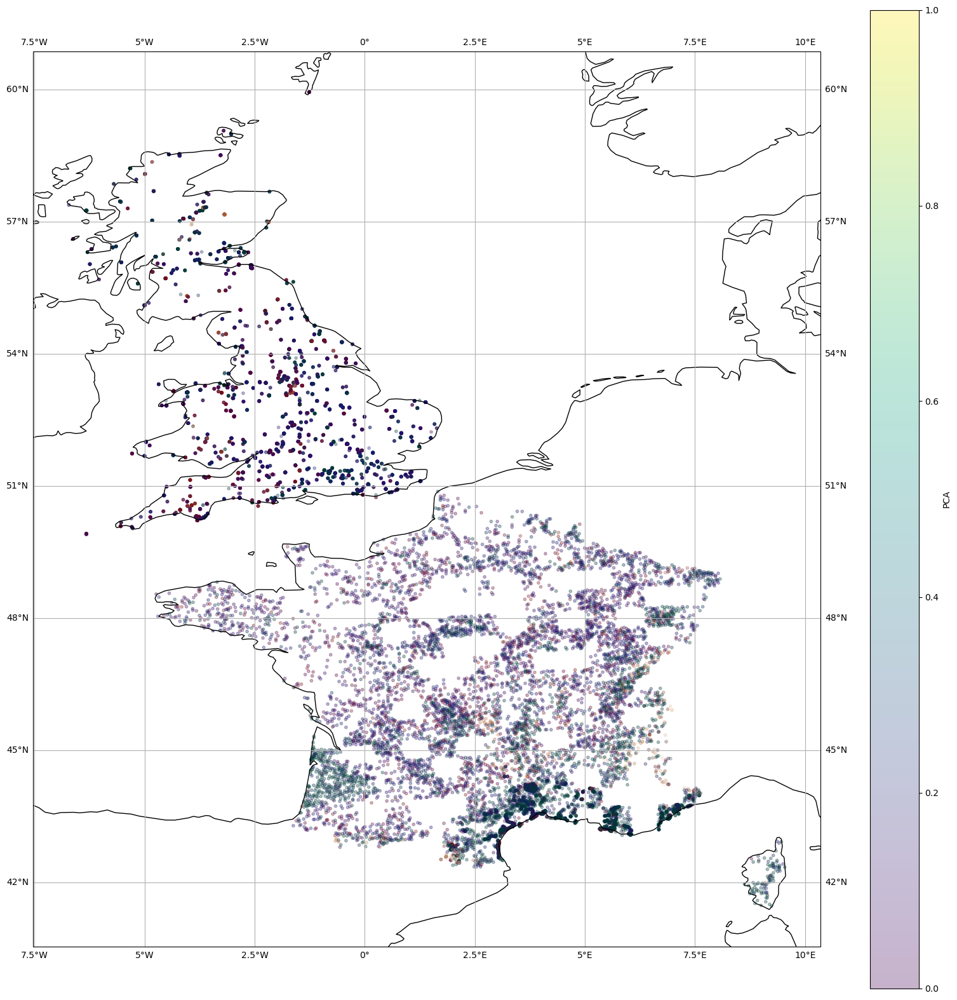

<Figure size 640x480 with 0 Axes>

In [9]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

# Load the data from the CSV file
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
data2 = pd.read_csv(data_path + 'GLC/timeseriesX.csv', sep=",", header='infer', low_memory=True)
#print(data2.head)
#grouped_data = data.groupby(['lat', 'lon'])['speciesId'].apply(lambda x: ','.join(map(str, x))).reset_index()

#df = grouped_data[['lon', 'lat', 'speciesId']]

#df_unique = data[['lon', 'lat', 'speciesId']]
#print(data2.head)
#data2['Jaccard'] = pd.to_numeric(data2['Jaccard'], errors='coerce')
# Split the values in the column
#data2['Jaccard'] = data2['Jaccard'].astype(float)

#data2['Predicted'] = data2['Predicted'].str.split(' ')
species_df = data2['Predicted'].str.get_dummies(sep=' ')

# Conversion des colonnes en entiers (0 et 1)
species_df = species_df.astype(int)

#print(species_df)
# Imprimer les espèces avec la valeur 1 dans la première ligne
species_row = species_df.iloc[0]
species_1 = species_row[species_row == 1].index.tolist()
# Convert the values to a matrix
#length_of_each_line = 6218
#matrix = np.array(data2['Predicted'].tolist(), dtype = float)

# Assign the matrix back to the DataFrame or use it for further analysis
#data['your_column'] = matrix
#data2 = data2.infer_objects()

presence_absence_matrix = species_df.values 
print(presence_absence_matrix)
#print(matrix.shape)
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized2 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized2[:, 0]
pc2 = pca_result_normalized2[:, 1]
pc3 = pca_result_normalized2[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=rgb_values, transform=ccrs.PlateCarree(),s=10,  alpha=0.3)
cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
plt.savefig('TimeSeriesBioAl.png')

[[1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[ 7.88569859  7.94531043 -2.97342546]
 [ 7.88569859  7.94531043 -2.97342546]
 [ 8.44256717  7.85976288 -2.83591212]
 ...
 [-6.952201    1.92142172 -1.00455212]
 [-1.36120039 -0.99893052  3.46448104]
 [-6.17359373  1.38573454  0.01936401]]


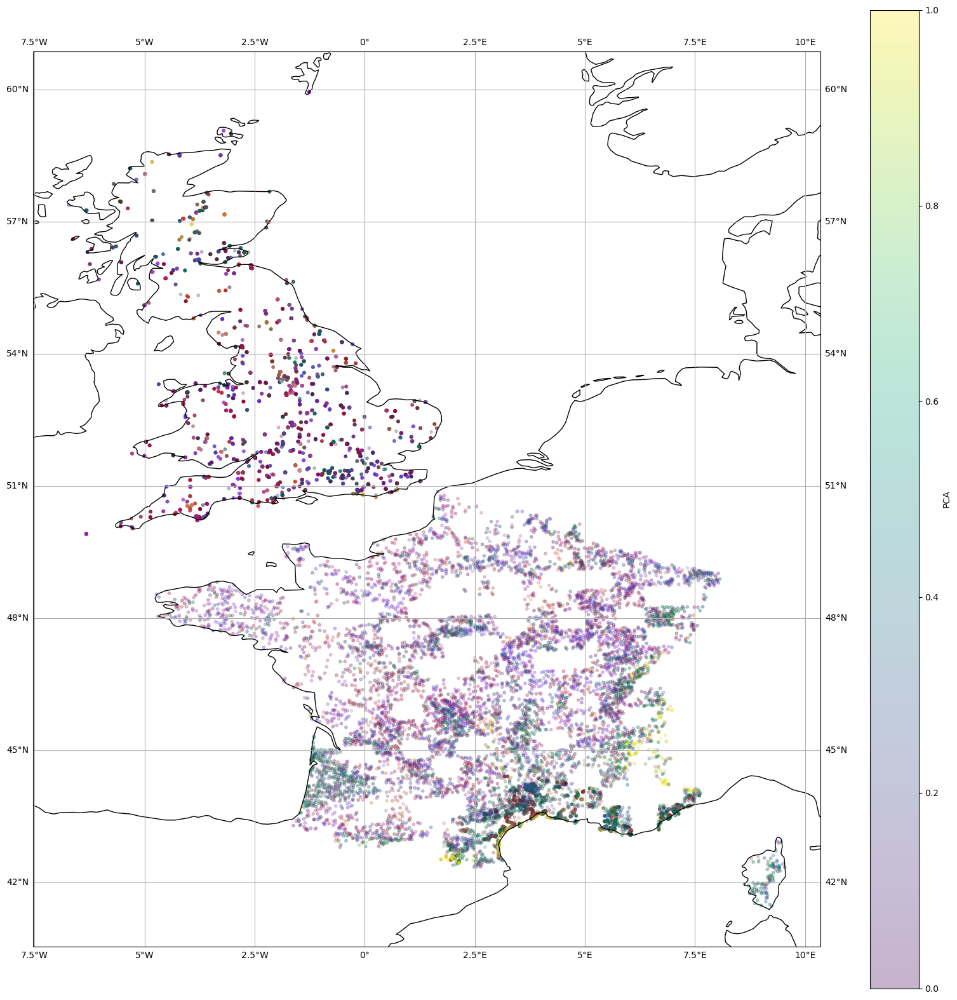

<Figure size 640x480 with 0 Axes>

In [11]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

# Load the data from the CSV file
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
data2 = pd.read_csv(data_path + 'GLC/timeseriesX2.csv', sep=",", header='infer', low_memory=True)
#print(data2.head)
#grouped_data = data.groupby(['lat', 'lon'])['speciesId'].apply(lambda x: ','.join(map(str, x))).reset_index()

#df = grouped_data[['lon', 'lat', 'speciesId']]

#df_unique = data[['lon', 'lat', 'speciesId']]
#print(data2.head)
#data2['Jaccard'] = pd.to_numeric(data2['Jaccard'], errors='coerce')
# Split the values in the column
#data2['Jaccard'] = data2['Jaccard'].astype(float)

#data2['Predicted'] = data2['Predicted'].str.split(' ')
species_df = data2['Predicted'].str.get_dummies(sep=' ')

# Conversion des colonnes en entiers (0 et 1)
species_df = species_df.astype(int)

#print(species_df)
# Imprimer les espèces avec la valeur 1 dans la première ligne
species_row = species_df.iloc[0]
species_1 = species_row[species_row == 1].index.tolist()
# Convert the values to a matrix
#length_of_each_line = 6218
#matrix = np.array(data2['Predicted'].tolist(), dtype = float)

# Assign the matrix back to the DataFrame or use it for further analysis
#data['your_column'] = matrix
#data2 = data2.infer_objects()

presence_absence_matrix = species_df.values 
print(presence_absence_matrix)
#print(matrix.shape)
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized3 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized3[:, 0]
pc2 = pca_result_normalized3[:, 1]
pc3 = pca_result_normalized3[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=rgb_values, transform=ccrs.PlateCarree(),s=10,  alpha=0.3)
cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
plt.savefig('TimeSeriesBioA2.png')

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[-4.55736835e-01  7.30425474e-02 -8.42786254e-01]
 [-4.55736835e-01  7.30425474e-02 -8.42786254e-01]
 [-9.80362906e-02  1.31446597e-03 -1.23627256e+00]
 ...
 [ 1.24904427e+00  1.34742508e-01  5.21385200e-02]
 [ 1.25130893e+00 -1.43562715e+00  7.71518163e-01]
 [ 2.25279995e+00 -7.25642846e-01  4.94112055e-01]]


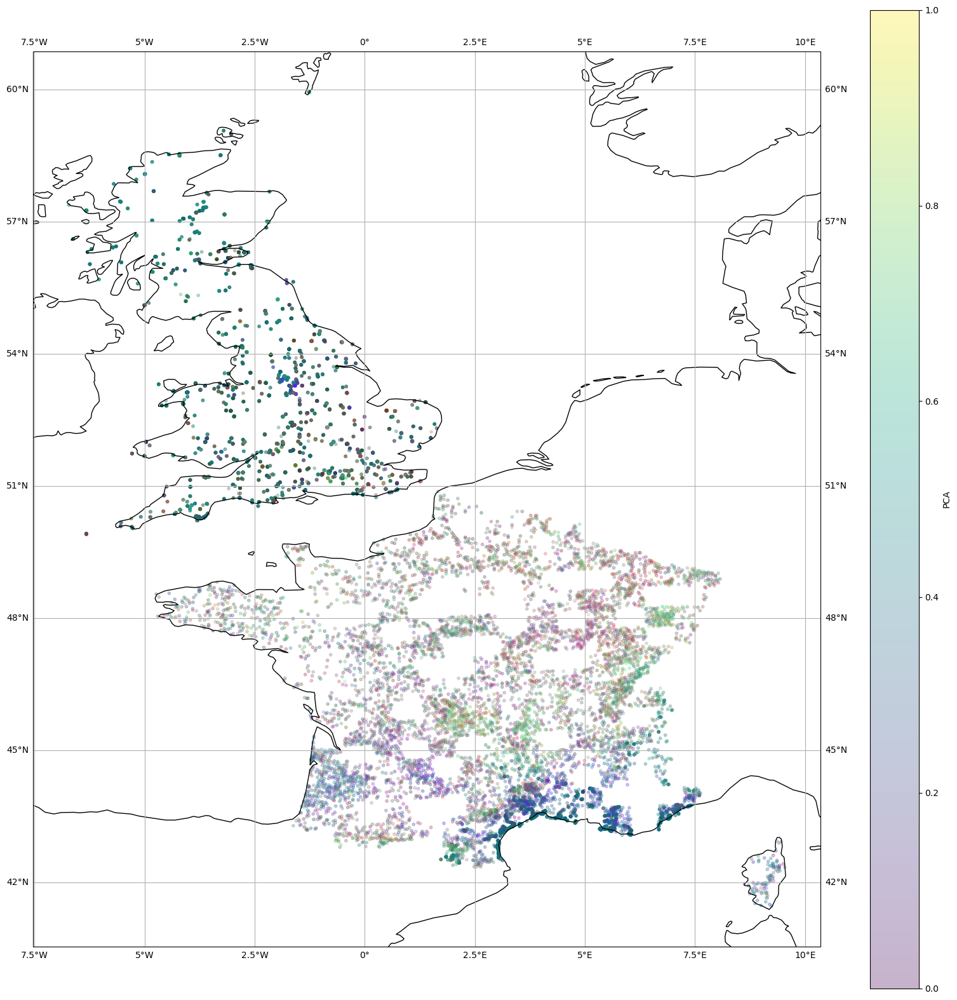

<Figure size 640x480 with 0 Axes>

In [12]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

# Load the data from the CSV file
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
df1= pd.read_csv(data_path + 'test_final.csv', sep=",", header='infer', low_memory=True)


df2 = pd.read_csv(data_path + 'GLC/submission4.csv', sep=",", header='infer', low_memory=True)

# Supprimer les doublons basés sur la latitude et la longitude du premier fichier
df1_cleaned = df1.drop_duplicates(subset=['lat', 'lon'])

# Appliquer les mêmes suppressions au deuxième fichier en utilisant les indices des lignes à supprimer
indices_to_remove = df2[df2['Id'].isin(df1[df1.duplicated(subset=['lat', 'lon'])]['Id'])].index
df2_cleaned = df2.drop(indices_to_remove)


#data2['Predicted'] = data2['Predicted'].str.split(' ')
species_df = df2_cleaned['Predicted'].str.get_dummies(sep=' ')

# Conversion des colonnes en entiers (0 et 1)
species_df = species_df.astype(int)

#print(species_df)
# Imprimer les espèces avec la valeur 1 dans la première ligne
species_row = species_df.iloc[0]
species_1 = species_row[species_row == 1].index.tolist()
# Convert the values to a matrix
#length_of_each_line = 6218
#matrix = np.array(data2['Predicted'].tolist(), dtype = float)

# Assign the matrix back to the DataFrame or use it for further analysis
#data['your_column'] = matrix
#data2 = data2.infer_objects()

presence_absence_matrix = species_df.values 
print(presence_absence_matrix)
#print(matrix.shape)
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized4 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized4[:, 0]
pc2 = pca_result_normalized4[:, 1]
pc3 = pca_result_normalized4[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=rgb_values, transform=ccrs.PlateCarree(),s=10,  alpha=0.3)
cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
plt.savefig('TimeSeriesBioA2.png')

In [8]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

# Load the data from the CSV file
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
df1= pd.read_csv(data_path + 'test_final.csv', sep=",", header='infer', low_memory=True)


df2 = pd.read_csv(data_path + 'GLC/Pred_Dino.csv', sep=",", header='infer', low_memory=True)

# Supprimer les doublons basés sur la latitude et la longitude du premier fichier
df1_cleaned = df1.drop_duplicates(subset=['lat', 'lon'])

# Appliquer les mêmes suppressions au deuxième fichier en utilisant les indices des lignes à supprimer
indices_to_remove = df2[df2['Id'].isin(df1[df1.duplicated(subset=['lat', 'lon'])]['Id'])].index
df2_cleaned = df2.drop(indices_to_remove)


#data2['Predicted'] = data2['Predicted'].str.split(' ')
species_df = df2_cleaned['Predicted'].str.get_dummies(sep=' ')

# Conversion des colonnes en entiers (0 et 1)
species_df = species_df.astype(int)

#print(species_df)
# Imprimer les espèces avec la valeur 1 dans la première ligne
species_row = species_df.iloc[0]
species_1 = species_row[species_row == 1].index.tolist()
# Convert the values to a matrix
#length_of_each_line = 6218
#matrix = np.array(data2['Predicted'].tolist(), dtype = float)

# Assign the matrix back to the DataFrame or use it for further analysis
#data['your_column'] = matrix
#data2 = data2.infer_objects()

presence_absence_matrix = species_df.values 
print(presence_absence_matrix)
#print(matrix.shape)
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized4 = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized4[:, 0]
pc2 = pca_result_normalized4[:, 1]
pc3 = pca_result_normalized4[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=rgb_values, transform=ccrs.PlateCarree(),s=10,  alpha=0.3)
cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
plt.savefig('DinoBio.png')

KeyboardInterrupt: 

## Distance de similarité entre les matrices obtenus des Pcas.

In [13]:
difference_matrix1 = pca_result_normalized0 - pca_result_normalized4
difference_matrix2 = pca_result_normalized0 - pca_result_normalized3
difference_matrix3 = pca_result_normalized0 - pca_result_normalized2


euclidean_distance1 = np.linalg.norm(difference_matrix1)
euclidean_distance2 = np.linalg.norm(difference_matrix2)
euclidean_distance3 = np.linalg.norm(difference_matrix3)

print(" La distance euclidienne entre 3 predictions Timeseries : Euclid 1 :{}; Euclid 2: {}; Euclid3 : {}".format(euclidean_distance1,euclidean_distance2,euclidean_distance3))

 La distance euclidienne entre 3 predictions Timeseries : Euclid 1 :42.11916554852174; Euclid 2: 74.59389838448953; Euclid3 : 73.6146693688151


## # Prediction avec Resnet  

In [ ]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

# Load the data from the CSV file
data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)
data2 = pd.read_csv(data_path + 'GLC/Pred_resnet18.csv', sep=",", header='infer', low_memory=True)
#print(data2.head)
grouped_data = data.groupby(['lat', 'lon'])['speciesId'].apply(lambda x: ','.join(map(str, x))).reset_index()

df = grouped_data[['lon', 'lat', 'speciesId']]

#df_unique = data[['lon', 'lat', 'speciesId']]
#print(data2.head)
#data2['Jaccard'] = pd.to_numeric(data2['Jaccard'], errors='coerce')
# Split the values in the column
#data2['Jaccard'] = data2['Jaccard'].astype(float)

#data2['Predicted'] = data2['Predicted'].str.split(' ')
species_df = data2['Predicted'].str.get_dummies(sep=' ')

# Conversion des colonnes en entiers (0 et 1)
species_df = species_df.astype(int)

#print(species_df)
# Imprimer les espèces avec la valeur 1 dans la première ligne
species_row = species_df.iloc[0]
species_1 = species_row[species_row == 1].index.tolist()
# Convert the values to a matrix
#length_of_each_line = 6218
#matrix = np.array(data2['Predicted'].tolist(), dtype = float)

# Assign the matrix back to the DataFrame or use it for further analysis
#data['your_column'] = matrix
#data2 = data2.infer_objects()

presence_absence_matrix = species_df.values 
print(presence_absence_matrix)
#print(matrix.shape)
#presence_absence_matrix = pd.get_dummies(df, columns=['speciesId'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)
#print(presence_absence_matrix)

# Select the continuous variables for PCA
#pca_data = presence_absence_matrix[['lon', 'lat']]

# Apply PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Normalize the PCA results to the range [0, 1]
pca_result_normalized = (pca_result - pca_result.min(axis=0)) / (pca_result.max(axis=0) - pca_result.min(axis=0))

# Définir une colormap personnalisée pour représenter les valeurs RGB

# Extraire les trois premières composantes normalisées
pc1 = pca_result_normalized[:, 0]
pc2 = pca_result_normalized[:, 1]
pc3 = pca_result_normalized[:, 2]

# Create a figure and a map projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Combine the three PCA components as RGB values
rgb_values =np.column_stack((pc1, pc2, pc3))
#pca_result_normalized[:, :3]

# Add markers for each location with the RGB values as colors
scatter = ax.scatter(df['lon'], df['lat'], c=rgb_values, transform=ccrs.PlateCarree(),s=15,  alpha=0.5)
cbar = plt.colorbar(scatter, label='PCA')

# Add map boundaries and projection details
ax.coastlines()
ax.gridlines(draw_labels=True)

# Show the map
plt.show()
plt.savefig('ResBioAl.png')

In [ ]:
p_rgb = JpegPatchProvider(data_path+'SatelliteImages/') # take all sentinel imagery layers (r,g,b,nir = 4 layers)

df0 = pd.read_csv(data_path + 'PAbsences.csv', sep=",", header='infer', low_memory=True)

evalset = PatchesDataset(occurrences = data_path + 'PAbsences.csv',
    providers=(p_rgb))

In [ ]:

model.eval()
for sample_id in range(len(testdataset)):
    test_img = testdataset[sample_id]
    with torch.no_grad():
        raw_pred = model(test_img.squeeze(1)).cpu().numpy()[0]
        raw_pred = np.array(raw_pred > 0.40, dtype=float)
    predicted_labels = np.array(targets_sorted)[np.argwhere(raw_pred > 0)[:, 0]] # carefull here
    print(predicted_labels)
    if not len(predicted_labels): 
        predicted_labels = ['no predictions']
    #img_labels = np.array(train_dataset.classes)[np.argwhere(test_labels > 0)[:, 0]]
    #print("Predicted labels: {} \nGT labels: {}".format(predicted_labels, img_labels), end="\n ------------ \n")
    df = df.append({ 'Predicted': lig}, ignore_index=True)
#df.to_csv('.csv',sep=",", index=False)

In [ ]:
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Charger les données à partir du fichier CSV
#data = pd.read_csv(validation_path, sep=";", header='infer', low_memory=True)

df = df[['patchID', 'lon', 'lat', 'speciesId','Predicted']]

df_unique = df.drop_duplicates(subset=['lon', 'lat'])

presence_absence_matrix = pd.get_dummies(df_unique, columns=['Predicted'], prefix='', prefix_sep='').groupby(['patchID', 'lon', 'lat']).max().reset_index(drop=True)

pca = PCA(n_components=3)  # Réduire à deux dimensions pour la visualisation sur une carte
pca_result = pca.fit_transform(presence_absence_matrix)
print(pca_result)

# Créer une figure et une projection cartographique
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# Ajouter les marqueurs pour chaque lieu avec les coordonnées PCA
scatter = ax.scatter(df_unique['lon'], df_unique['lat'], c=pca_result[:, 2], cmap='plasma', transform=ccrs.PlateCarree())
cbar = plt.colorbar(scatter, label='PC3')

# Ajouter les limites de la carte et les détails de la projection
ax.coastlines()
ax.gridlines(draw_labels=True)

# Afficher la carte
plt.show()

In [ ]:

difference_matrix = matrix1 - matrix2

euclidean_distance = np.linalg.norm(difference_matrix)
